In [247]:
# Isaac Berez
# 17.01.23
import sys
from scipy.io import mmread
import os
import glob
import pandas as pd
import numpy as np
#from pandas_ods_reader import read_ods
from copy import deepcopy
import pprint
import json
import re
from datetime import datetime
import logging
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn import preprocessing
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.cluster import DBSCAN
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import VALID_METRICS
from collections import Counter
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import harmonypy as hm
from matplotlib.cm import ScalarMappable
from datetime import date
import mpld3
import hvplot.pandas
import holoviews as hv
from holoviews import opts
import panel as pn
import bokeh
from bokeh.resources import INLINE
import bbknn
import matplotlib as mpl
from sklearn.model_selection import train_test_split
from scipy.stats import mode
from sklearn.metrics import confusion_matrix


import dimorph_processing as dp
import cell_comparison as cc
import sd_v_amy_tsne_harmony_comp as thc


today = str(date.today())
%matplotlib notebook
%load_ext autoreload
%autoreload 2

#mpl.rcParams['pdf.fonttype'] = 42
#mpl.rcParams['ps.fonttype'] = 42

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Analyze similarity between SD dataset and Amy dataset by integrating with harmony and

1) Concat two datasets using an intersected gene list: [genesXcells]Amy [genesXcells]SD
2) Feature Selection (CV highest variable genes) on each dataset seperately and use the union, recombine
3) PCA Dimensionality Reduction, using find knee to get cutoff 
4) Harmony Integration, with vars_use = dataset (?), iterate until convergence
5) Tsne with harmony as input
5) Run Tsne on each, visulize, color each cell by dataset, color each cell in the SD dataset by the match cell type in the FC dataset

Load data

In [3]:
IEG_list = []
with open('/bigdata/isaac/IEG_cluster.txt', 'r') as fh:
    for g in fh:
        IEG_list.append(g[:-1])

In [4]:
sex_gene_list = []
with open('/bigdata/isaac/sex_gene_list.txt', 'r') as fh:
    for g in fh:
        sex_gene_list.append(g[:-1])

In [5]:
amy_df_orig = pd.read_csv('/bigdata/isaac/amy_fc_data/Amy_FC_allcells_with_metadata_31-Jul-2022.txt', encoding='utf-8', delimiter='\t') 



/tmp/ipykernel_2480800/2145579833.py:1: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,2

In [1]:
amy_df_orig

NameError: name 'amy_df_orig' is not defined

In [6]:
amy_metadata_df = amy_df_orig.iloc[:4,:]
amy_metadata_df = amy_metadata_df.set_index('cellID')

In [107]:
amy_metadata_df

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,2,2,2,2,2,2,2,2,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]",...,[],[],[],[],[],[],[],[],[],[]
full_name,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
_, idx = np.unique(amy_metadata_df.loc['celltype'], return_index=True)
amy_celltype = np.array(amy_metadata_df.loc['celltype'][np.sort(idx)])
list(amy_celltype)

/tmp/ipykernel_2274886/1349414274.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_celltype = np.array(amy_metadata_df.loc['celltype'][np.sort(idx)])


['GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-30-Prlr-Calcr',
 'GABA-50-Chat-Vip',
 'GABA-43-Crabp1-Etv1',
 'GABA-13-Adora2a-Crh',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-48-Reln-Crim1',
 'GABA-18-Isl1-Tac1',
 'GABA-15-Drd1-Ebf1',
 'GABA-14-Drd1-Scn4b',
 'GABA-19-Isl1-Aldoc',
 'GABA-55-Sncg-Vip',
 'GABA-31-Prlr-Cbln1',
 'GABA-34-Prlr-Satb1',
 'GABA-1-Foxp2_Fmod',
 'GABA-22-Gal-Avp',
 'GABA-25-Lhx8-Th',
 'GABA-20-Gpr101-Gabre',
 'GABA-42-Moxd1-Vwc2',
 'GABA-41-Moxd1-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-4-Foxp2_Htr1f',
 'GABA-54-Scng-Kcnc2',
 'GABA-29-Prlr-Greb1',
 'GABA-46-Lamp5-Kit',
 'GABA-56-Sncg-Krt73',
 'GABA-27-Lhx6-Nxph2',
 'GABA-23-Fign-Lrpprc',
 'GABA-28-Cbln4-Luzp2',
 'GABA-49-Npnt-Calca',
 'GABA-8-Prkcd-Oprk1',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-3-Foxp2_Col6a1',
 'GABA-10-Prkcd-Adora2a',
 'GABA-9-Prkcd-Ezr',
 'GABA-16-Prkcd-Nts',
 'GABA-52-Calb2-Rgs12',
 'GABA-47-Reln-Ndnf',
 'GABA-53-Htr3a-Kcnc2',
 'GABA-40-Rpb4-Sst',
 'GABA-2-Foxp2_Adra2a',
 'GABA-26-Cbln4-

In [10]:

cls = [x.split('-')[0] for x in np.array(amy_metadata_df.loc['celltype'])]
amy_metadata_df.loc['cell_class'] = cls
markers = [re.split(r"-|_",x)[2:4] for x in np.array(amy_metadata_df.loc['celltype'])]
amy_metadata_df.loc['markers'] = markers


In [108]:
amy_metadata_df

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,2,2,2,2,2,2,2,2,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]",...,[],[],[],[],[],[],[],[],[],[]
full_name,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
#get dendrogram order
amy_celltype_subset = amy_celltype[:-14]

In [13]:
amy_celltype[-14:]

array(['Astro', 'Astro_SC', 'Astro_agt', 'COP', 'EC', 'Epend', 'OL',
       'OPC', 'OPC_cycling', 'Peri', 'VLMC', 'VSM', 'microglia', 'pvm'],
      dtype=object)

In [14]:
amy_gabas = [x for x in amy_celltype_subset if x[:4]=='GABA']
amy_gabas_sorted = sorted(amy_gabas, key=lambda x: int(x.split('-')[1]))
amy_vglut1s = [x for x in amy_celltype_subset if x[:6]=='VGLUT1']
amy_vglut1s_sorted = sorted(amy_vglut1s, key=lambda x: int(x.split('-')[1]))
amy_vglut2s = [x for x in amy_celltype_subset if x[:6]=='VGLUT2']
amy_vglut2s_sorted = sorted(amy_vglut2s, key=lambda x: int(x.split('-')[1]))

In [15]:
amy_dd_order = np.concatenate((amy_gabas_sorted,amy_vglut1s_sorted,amy_vglut2s_sorted, amy_celltype[-14:]))

In [109]:
amy_dd_order

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [17]:
#use '-' consistently instead of occasional '_' in marker names
amy_dd_order = [x.replace("_", "-") for x in amy_dd_order]

In [110]:
amy_dd_order

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [6]:
amy_df = amy_df_orig.set_index('cellID')
amy_df = amy_df.iloc[4:,:]

In [557]:
#load in all SD filtered metadata with subclass labels
with open('/bigdata/isaac/gaba_glut_NN_combined_metadata_full_name2025-04-14.json') as json_data:
    sd_metadata = json.load(json_data)
sd_metadata = pd.DataFrame.from_dict(sd_metadata, orient='columns')
sd_df = pd.read_feather('/bigdata/isaac/df_orig.feather')
sd_df = sd_df.reindex(columns=sd_metadata.columns)

In [558]:
sd_metadata

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Serial_Number,103.0,102.0,102.0,103.0,98.0,101.0,98.0,63.0,66.0,70.0,...,67.0,66.0,66.0,63.0,63.0,68.0,64.0,67.0,64.0,67.0
Date_Captured,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,2019-11-20,2019-11-24,2019-12-01,...,2019-11-25,2019-11-24,2019-11-24,2019-11-20,2019-11-20,2019-11-25,2019-11-20,2019-11-25,2019-11-20,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,,,,...,,,,,,,,,,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Breeder-M,Breeder-F,Breeder-F,Breeder-M,Breeder-F,Breeder-F,Breeder-F,Naïve-F,Naïve-M,Naïve-F,...,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Naïve-F,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Naïve-M
ChipID,10X52,10X52,10X52,10X52,10X51,10X52,10X51,10X35,10X36,10X38,...,10X37,10X36,10X36,10X35,10X35,10X37,10X35,10X37,10X35,10X37
SampleID,10X52_3,10X52_2,10X52_2,10X52_3,10X51_2,10X52_1,10X51_2,10X35_1,10X36_2,10X38_2,...,10X37_1,10X36_2,10X36_2,10X35_1,10X35_1,10X37_2,10X35_2,10X37_1,10X35_2,10X37_1
DonorID,DI-B3-M,DI-B3-F,DI-B3-F,DI-B3-M,DI-B1-F,DI-B3-F,DI-B1-F,"DI1,DI2",DI3,DI6,...,"DI4,DI5",DI3,DI3,"DI1,DI2","DI1,DI2","DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2","DI4,DI5"


In [8]:
amy_df = dp.gene_remover(IEG_list,amy_df)

removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


In [9]:
amy_df = dp.gene_remover(sex_gene_list,amy_df)

removing  6  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']


In [10]:
sd_df = dp.gene_remover(IEG_list,sd_df)

removing  53  genes found in  ['Btg2', 'Jun', 'Egr4', 'Fosb', 'Junb', 'Gadd45g', 'Fos', 'Arc', 'Nr4a1', 'Npas4', 'Coq10b', 'Tns1', 'Per2', 'Ptgs2', 'Rnd3', 'Tnfaip6', 'Srxn1', 'Tiparp', 'Ccnl1', 'Mcl1', 'Dnajb5', 'Nr4a3', 'Fosl2', 'Nptx2', 'Rasl11a', 'Mest', 'Sertad1', 'Egr2', 'Midn', 'Gadd45b', 'Dusp6', 'Irs2', 'Plat', 'Ier2', 'Rrad', 'Tpbg', 'Csrnp1', 'Peli1', 'Per1', 'Kdm6b', 'Inhba', 'Plk2', 'Ifrd1', 'Baz1a', 'Trib1', 'Pim3', 'Lrrk2', 'Dusp1', 'Cdkn1a', 'Pim1', 'Sik1', 'Frat2', 'Dusp5']


In [11]:
sd_df = dp.gene_remover(sex_gene_list,sd_df)

removing  6  genes found in  ['Xist', 'Tsix', 'Ddx3y', 'Eif2s3y', 'Kdm5d', 'Uty']


In [26]:
amy_df.shape

(27939, 55514)

In [27]:
sd_df.shape

(27874, 36706)

In [30]:
np.any(sd_metadata.columns ==sd_df.columns)

True

In [31]:
sd_metadata.shape

(31, 36706)

In [32]:
sd_metadata

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Serial_Number,103.0,102.0,102.0,103.0,98.0,101.0,98.0,63.0,66.0,70.0,...,67.0,66.0,66.0,63.0,63.0,68.0,64.0,67.0,64.0,67.0
Date_Captured,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,05/31/20,2019-11-20,2019-11-24,2019-12-01,...,2019-11-25,2019-11-24,2019-11-24,2019-11-20,2019-11-20,2019-11-25,2019-11-20,2019-11-25,2019-11-20,2019-11-25
Species,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,...,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm,Mm
Transcriptome,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,...,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10,Mm10
Strain,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,C57Bl/6,,,,...,,,,,,,,,,
Project,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,...,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph,Dimorph
Group,Breeder-M,Breeder-F,Breeder-F,Breeder-M,Breeder-F,Breeder-F,Breeder-F,Naïve-F,Naïve-M,Naïve-F,...,Naïve-M,Naïve-M,Naïve-M,Naïve-F,Naïve-F,Naïve-M,Naïve-F,Naïve-M,Naïve-F,Naïve-M
ChipID,10X52,10X52,10X52,10X52,10X51,10X52,10X51,10X35,10X36,10X38,...,10X37,10X36,10X36,10X35,10X35,10X37,10X35,10X37,10X35,10X37
SampleID,10X52_3,10X52_2,10X52_2,10X52_3,10X51_2,10X52_1,10X51_2,10X35_1,10X36_2,10X38_2,...,10X37_1,10X36_2,10X36_2,10X35_1,10X35_1,10X37_2,10X35_2,10X37_1,10X35_2,10X37_1
DonorID,DI-B3-M,DI-B3-F,DI-B3-F,DI-B3-M,DI-B1-F,DI-B3-F,DI-B1-F,"DI1,DI2",DI3,DI6,...,"DI4,DI5",DI3,DI3,"DI1,DI2","DI1,DI2","DI4,DI5","DI1,DI2","DI4,DI5","DI1,DI2","DI4,DI5"


1) Concat two datasets using an intersected gene list: [genesXcells]Amy [genesXcells]SD

In [33]:
intersected_gene_ind = amy_df.index.intersection(sd_df.index)

In [34]:
intersected_gene_ind

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15',
       'Lypla1', 'Gm37988', 'Tcea1',
       ...
       'AC125149.1', 'AC125149.2', 'AC125149.4', 'AC234645.1', 'AC168977.2',
       'AC168977.1', 'PISD', 'DHRSX', 'Vmn2r122', 'CAAA01147332.1'],
      dtype='object', length=27874)

In [35]:
amy_df.duplicated()

cellID
Xkr4              False
Gm1992            False
Gm37381           False
Rp1               False
Rp1                True
                  ...  
AC168977.1        False
PISD              False
DHRSX             False
Vmn2r122           True
CAAA01147332.1    False
Length: 27939, dtype: bool

In [12]:
#remove duplicate gene indices
amy_df = amy_df[~amy_df.index.duplicated(keep='first')]

In [13]:
amy_df.shape

(27874, 55514)

In [38]:
amy_df = amy_df.reindex(index = intersected_gene_ind)
sd_df = sd_df.reindex(index = intersected_gene_ind)

In [39]:
amy_df.head()

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
Xkr4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [40]:
sd_df.head()

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Xkr4,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [41]:
amy_sd_df = pd.concat([amy_df,sd_df],axis=1)

In [42]:
amy_sd_df.head()

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
Xkr4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [43]:
amy_metadata_df

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,2,2,2,2,2,2,2,2,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]",...,[],[],[],[],[],[],[],[],[],[]


In [111]:
pd.unique(amy_metadata_df.loc['celltype',:])

array(['GABA-11-Adora2a-Id4', 'GABA-12-Adora2a-Scn4b',
       'GABA-30-Prlr-Calcr', 'GABA-50-Chat-Vip', 'GABA-43-Crabp1-Etv1',
       'GABA-13-Adora2a-Crh', 'GABA-7-Pax6-Cyp26a1', 'GABA-48-Reln-Crim1',
       'GABA-18-Isl1-Tac1', 'GABA-15-Drd1-Ebf1', 'GABA-14-Drd1-Scn4b',
       'GABA-19-Isl1-Aldoc', 'GABA-55-Sncg-Vip', 'GABA-31-Prlr-Cbln1',
       'GABA-34-Prlr-Satb1', 'GABA-1-Foxp2_Fmod', 'GABA-22-Gal-Avp',
       'GABA-25-Lhx8-Th', 'GABA-20-Gpr101-Gabre', 'GABA-42-Moxd1-Vwc2',
       'GABA-41-Moxd1-Pvalb', 'GABA-45-Lamp5-Hctr2', 'GABA-4-Foxp2_Htr1f',
       'GABA-54-Scng-Kcnc2', 'GABA-29-Prlr-Greb1', 'GABA-46-Lamp5-Kit',
       'GABA-56-Sncg-Krt73', 'GABA-27-Lhx6-Nxph2', 'GABA-23-Fign-Lrpprc',
       'GABA-28-Cbln4-Luzp2', 'GABA-49-Npnt-Calca', 'GABA-8-Prkcd-Oprk1',
       'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th', 'GABA-3-Foxp2_Col6a1',
       'GABA-10-Prkcd-Adora2a', 'GABA-9-Prkcd-Ezr', 'GABA-16-Prkcd-Nts',
       'GABA-52-Calb2-Rgs12', 'GABA-47-Reln-Ndnf', 'GABA-53-Htr3a-Kcnc2',
    

In [112]:
#fix inconsistent - and _ in cell type
tmp = [x.replace("_", "-") for x in list(amy_metadata_df.loc['celltype',:])]
#amy_metadata_df.loc['full_name',:]= tmp

In [119]:
len(tmp)

55514

In [120]:
amy_metadata_df.shape[1]

55514

In [121]:
amy_metadata_df_copy = deepcopy(amy_metadata_df)

In [122]:
amy_metadata_df_copy.loc['full_name',:] = tmp

In [123]:
pd.unique(amy_metadata_df_copy.loc['full_name',:])

array(['GABA-11-Adora2a-Id4', 'GABA-12-Adora2a-Scn4b',
       'GABA-30-Prlr-Calcr', 'GABA-50-Chat-Vip', 'GABA-43-Crabp1-Etv1',
       'GABA-13-Adora2a-Crh', 'GABA-7-Pax6-Cyp26a1', 'GABA-48-Reln-Crim1',
       'GABA-18-Isl1-Tac1', 'GABA-15-Drd1-Ebf1', 'GABA-14-Drd1-Scn4b',
       'GABA-19-Isl1-Aldoc', 'GABA-55-Sncg-Vip', 'GABA-31-Prlr-Cbln1',
       'GABA-34-Prlr-Satb1', 'GABA-1-Foxp2-Fmod', 'GABA-22-Gal-Avp',
       'GABA-25-Lhx8-Th', 'GABA-20-Gpr101-Gabre', 'GABA-42-Moxd1-Vwc2',
       'GABA-41-Moxd1-Pvalb', 'GABA-45-Lamp5-Hctr2', 'GABA-4-Foxp2-Htr1f',
       'GABA-54-Scng-Kcnc2', 'GABA-29-Prlr-Greb1', 'GABA-46-Lamp5-Kit',
       'GABA-56-Sncg-Krt73', 'GABA-27-Lhx6-Nxph2', 'GABA-23-Fign-Lrpprc',
       'GABA-28-Cbln4-Luzp2', 'GABA-49-Npnt-Calca', 'GABA-8-Prkcd-Oprk1',
       'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th', 'GABA-3-Foxp2-Col6a1',
       'GABA-10-Prkcd-Adora2a', 'GABA-9-Prkcd-Ezr', 'GABA-16-Prkcd-Nts',
       'GABA-52-Calb2-Rgs12', 'GABA-47-Reln-Ndnf', 'GABA-53-Htr3a-Kcnc2',
    

In [65]:
amy_dd_order

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [124]:
amy_metadata_df_dd_order = pd.DataFrame(index = amy_metadata_df_copy.index)
amy_metadata_df_dd_order

""
cellID
celltype
sample
FC time
batch
cell_class
markers
full_name


In [125]:
list(amy_dd_order)

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [559]:
sd_metadata_df_subset = sd_metadata.loc[['cell_class','markers','full_name', 'SampleID']]

In [560]:
sd_metadata_df_subset

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2
SampleID,10X52_3,10X52_2,10X52_2,10X52_3,10X51_2,10X52_1,10X51_2,10X35_1,10X36_2,10X38_2,...,10X37_1,10X36_2,10X36_2,10X35_1,10X35_1,10X37_2,10X35_2,10X37_1,10X35_2,10X37_1


In [90]:
amy_metadata_df_subset = amy_metadata_df.loc[['cell_class','markers','full_name']]
amy_metadata_df_subset

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]",...,[],[],[],[],[],[],[],[],[],[]
full_name,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]",...,[],[],[],[],[],[],[],[],[],[]
full_name,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [ ]:
#add 'sd' label row

In [561]:
l = ['sd']*sd_metadata_df_subset.shape[1]
l = np.reshape(l,(1,len(l)))
sd_label = pd.DataFrame(l, columns = sd_metadata_df_subset.columns, index = ['dataset'])
sd_metadata_df_subset = pd.concat([sd_metadata_df_subset,sd_label])
sd_metadata_df_subset

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2
SampleID,10X52_3,10X52_2,10X52_2,10X52_3,10X51_2,10X52_1,10X51_2,10X35_1,10X36_2,10X38_2,...,10X37_1,10X36_2,10X36_2,10X35_1,10X35_1,10X37_2,10X35_2,10X37_1,10X35_2,10X37_1
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [92]:
#fix nonneuronal formatting in amy metadata
main_classes = ['GABA','VGLUT1','VGLUT2']
updated_amy_cls_vector = []
for x in np.array(amy_metadata_df_subset.loc['cell_class']):
    if x not in main_classes:
        x = 'Nonneuronal'
        updated_amy_cls_vector.append(x)
    else:
        updated_amy_cls_vector.append(x)
amy_metadata_df_subset.loc['cell_class'] = updated_amy_cls_vector
amy_metadata_df_subset

KeyboardInterrupt: 

In [100]:
amy_metadata_df_subset = pd.read_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/v2_full_names/amy_metadata_df_subset_fs.json')

In [101]:
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,GTGGGAACACAGCCAC-1_75-2,CAGATTGGTGCAGATG-1_75-3,GGGAAGTCAAGGCCTC-1_76-1,AGGACTTGTAGATCCT-1_76-2,CAGTTCCGTAACCCTA-1_76-2,TGGGATTTCCCTCTCC-1_76-2,GGGTGAAGTCGATGCC-1_45-3,GCTCAAACACCAGTTA-1_74-1,TCATTGTTCAAACCTG-1_74-1,TGGAGGAGTTCCGGTG-1_74-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,microglia,microglia,microglia,microglia,microglia,microglia,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-13-microglia,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [99]:
sd_metadata_df_subset

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [129]:
amy_metadata_df_copy

,GGGTATTTCTCGCGTT-1_10-1,GGTAACTAGACATCCT-1_18-1,GGTAATCGTGGACTAG-1_18-1,TTCCGGTAGTGGTGGT-1_18-1,AGGGTGAAGTACAACA-1_19-1,AGTACCATCCCTGGTT-1_19-1,CATGAGTTCCGGCTTT-1_19-1,TTGCCTGAGACGGTTG-1_19-1,AAACGCTTCACCATGA-1_23-1,TACCCACCAGTGACCC-1_23-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,10-1,18-1,18-1,18-1,19-1,19-1,19-1,19-1,23-1,23-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,2,2,2,2,2,2,2,2,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]","[Adora2a, Id4]",...,[],[],[],[],[],[],[],[],[],[]
full_name,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,GABA-11-Adora2a-Id4,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm


In [141]:
amy_metadata_df_copy.loc[:,amy_metadata_df_copy.loc['full_name',:]==amy_dd_order[0]]

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,CCACTTGAGATTGAGT-1_76-2,CTCAGGGGTCAGTCCG-1_76-2,CTTGATTGTCTCAAGT-1_76-2,GCTTTCGCAGCGGTCT-1_76-2,GTCGTTCCAGGACTTT-1_76-2,TAGACCACATTCCTCG-1_76-2,TCTCACGGTGCAGTGA-1_76-2,TGAATCGTCCGAAATC-1_76-2,TGATTCTTCACAGAGG-1_76-2,TGTAACGAGAAGTGTT-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,2,2,2,2,2,2,2,2,2,2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA
markers,"[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]",...,"[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]"
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod


In [135]:
amy_dd_order

['GABA-1-Foxp2-Fmod',
 'GABA-2-Foxp2-Adra2a',
 'GABA-3-Foxp2-Col6a1',
 'GABA-4-Foxp2-Htr1f',
 'GABA-5-Pax6-Enpp2',
 'GABA-6-Pax6-Th',
 'GABA-7-Pax6-Cyp26a1',
 'GABA-8-Prkcd-Oprk1',
 'GABA-9-Prkcd-Ezr',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GA

In [147]:
amy_metadata_df_dd_order = pd.DataFrame()
#use amy_dd_order to resort amy_metadata_df
for n in list(amy_dd_order):
    #print (n)
    x = amy_metadata_df_copy.loc[:,amy_metadata_df_copy.loc['full_name']==n]
    #print (tmp)
    amy_metadata_df_dd_order = pd.concat([amy_metadata_df_dd_order,x],axis=1)

In [148]:
amy_metadata_df_dd_order

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
markers,"[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]",...,[],[],[],[],[],[],[],[],[],[]
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm


In [156]:
#fix nonneuronal formatting in amy metadata
main_classes = ['GABA','VGLUT1','VGLUT2']
updated_amy_cls_vector = []
for x in np.array(amy_metadata_df_dd_order.loc['cell_class']):
    if x not in main_classes:
        x = 'Nonneuronal'
        updated_amy_cls_vector.append(x)
    else:
        updated_amy_cls_vector.append(x)
amy_metadata_df_dd_order_fmt = amy_metadata_df_dd_order.copy()
amy_metadata_df_dd_order_fmt.loc['cell_class'] = updated_amy_cls_vector
amy_metadata_df_dd_order_fmt

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,"[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]","[Foxp2, Fmod]",...,[],[],[],[],[],[],[],[],[],[]
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm


In [187]:
amy_metadata_df_dd_order_fmt.loc['markers', :] = amy_metadata_df_dd_order_fmt.loc['markers', :].apply(
    lambda x: '-'.join(str(x).replace('[', '').replace(']', '').replace(',', '').replace("'", '').split())
)

In [189]:
amy_metadata_df_dd_order_fmt

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,,,,,,,,,,
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm


In [ ]:
#fix marker row formating
amy_metadata_df_dd_order_fmt.loc['markers', amy_metadata_df_dd_order_fmt.loc['cell_class']=='Nonneuronal'] = amy_metadata_df_dd_order_fmt.loc['celltype', amy_metadata_df_dd_order_fmt.loc['cell_class']=='Nonneuronal']

In [193]:
amy_metadata_df_dd_order_fmt

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm


In [ ]:
len(list(amy_metadata_df_dd_order_fmt.loc['full_name',amy_metadata_df_dd_order_fmt.loc['cell_class']=='Nonneuronal']))

25330

In [203]:
nn_ids = [1]
lst = list(amy_metadata_df_dd_order_fmt.loc['full_name',amy_metadata_df_dd_order_fmt.loc['cell_class']=='Nonneuronal'])
for i in range (1,len(lst)):
    #print (x)
    if lst[i] != lst[i-1]:
        nn_ids.append(nn_ids[-1]+1)
    else:
        nn_ids.append(nn_ids[-1])
nn_ids

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


In [218]:
nn_ids_str = [str(x) for x in nn_ids]

In [219]:
amy_nn_metadata = amy_metadata_df_dd_order_fmt.loc[:,amy_metadata_df_dd_order_fmt.loc['cell_class']=='Nonneuronal']
amy_nn_metadata.loc['id'] = nn_ids_str
amy_nn_metadata

/tmp/ipykernel_2274886/4226286757.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  amy_nn_metadata.loc['id'] = nn_ids_str


,AAACGCTCAGCCTTCT-1_08-1,AAAGGTATCATGGGAG-1_08-1,AAATGGAGTAACTGCT-1_08-1,AACCTGAAGACGGTCA-1_08-1,AACCTGAGTGAAAGTT-1_08-1,AAGAACAAGAAGGGAT-1_08-1,AATAGAGTCATCACTT-1_08-1,AATCGTGGTCGAATTC-1_08-1,AATGGCTCACGGTGAA-1_08-1,ACAGCCGTCCCAAGTA-1_08-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,08-1,08-1,08-1,08-1,08-1,08-1,08-1,08-1,08-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,0,0,0,0,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,Astro,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
id,1,1,1,1,1,1,1,1,1,1,...,14,14,14,14,14,14,14,14,14,14


In [220]:
amy_metadata_df_dd_order_fmt.loc['cell_class',amy_metadata_df_dd_order_fmt.loc['cell_class']=='Nonneuronal'] + '-' +  amy_nn_metadata.loc['id',: ]+ '-' + amy_metadata_df_dd_order_fmt.loc['markers',amy_metadata_df_dd_order_fmt.loc['cell_class']=='Nonneuronal']

AAACGCTCAGCCTTCT-1_08-1    Nonneuronal-1-Astro
AAAGGTATCATGGGAG-1_08-1    Nonneuronal-1-Astro
AAATGGAGTAACTGCT-1_08-1    Nonneuronal-1-Astro
AACCTGAAGACGGTCA-1_08-1    Nonneuronal-1-Astro
AACCTGAGTGAAAGTT-1_08-1    Nonneuronal-1-Astro
                                  ...         
CTCATCGTCACCCATC-1_76-2     Nonneuronal-14-pvm
CTGCCATGTATCGCTA-1_76-2     Nonneuronal-14-pvm
GCATGATTCTCGTCGT-1_76-2     Nonneuronal-14-pvm
TGGGCGTAGAAGCCAC-1_76-2     Nonneuronal-14-pvm
TTCTGTAGTGGTATGG-1_76-2     Nonneuronal-14-pvm
Length: 25330, dtype: object

In [222]:
amy_metadata_df_dd_order_fmt.loc['full_name',amy_metadata_df_dd_order_fmt.loc['cell_class']=='Nonneuronal'] = amy_metadata_df_dd_order_fmt.loc['cell_class',amy_metadata_df_dd_order_fmt.loc['cell_class']=='Nonneuronal'] + '-' +  amy_nn_metadata.loc['id',: ]+ '-' + amy_metadata_df_dd_order_fmt.loc['markers',amy_metadata_df_dd_order_fmt.loc['cell_class']=='Nonneuronal']

In [223]:
amy_metadata_df_dd_order_fmt

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm


In [229]:
amy_metadata_df_dd_order_fmt.loc['markers',amy_metadata_df_dd_order_fmt.loc['markers',:]=='Cd34-Papp2']

ACTCCCACAGCGTAGA-1_08-1    Cd34-Papp2
AGATGCTCACAGCGCT-1_08-1    Cd34-Papp2
TCGGTCTCAGCTGTTA-1_08-1    Cd34-Papp2
TGATTCTGTACCGCGT-1_08-1    Cd34-Papp2
AAACGCTTCACCATAG-1_10-1    Cd34-Papp2
                              ...    
CATACAGGTCCGAAAG-1_76-2    Cd34-Papp2
GTCACTCCACTGTGTA-1_76-2    Cd34-Papp2
GTCTAGAGTATGAGCG-1_76-2    Cd34-Papp2
GTTGCTCAGTCTCGTA-1_76-2    Cd34-Papp2
TTGGTTTCAGAGTGAC-1_76-2    Cd34-Papp2
Name: markers, Length: 186, dtype: object

In [239]:
#fix typos in amy data
amy_metadata_df_dd_order_fmt.loc['markers',amy_metadata_df_dd_order_fmt.loc['markers',:]=='Cd34-Papp2'] = 'Cd34-Pappa2'
amy_metadata_df_dd_order_fmt.loc['full_name',amy_metadata_df_dd_order_fmt.loc['markers',:]=='Cd34-Papp2'] = 'VGLUT2-3-Cd34-Pappa2'

amy_metadata_df_dd_order_fmt.loc['markers',amy_metadata_df_dd_order_fmt.loc['markers',:]=='Papp2-Cdh23'] = 'Pappa2-Cd34'
amy_metadata_df_dd_order_fmt.loc['full_name',amy_metadata_df_dd_order_fmt.loc['markers',:]=='Papp2-Cdh23'] = 'VGLUT2-18-Pappa2-Cdh23'


In [251]:
amy_metadata_df_dd_order_fmt.loc['full_name',amy_metadata_df_dd_order_fmt.loc['markers',:]=='Cd34-Pappa2'] = 'VGLUT2-3-Cd34-Pappa2'
amy_metadata_df_dd_order_fmt.loc['full_name',amy_metadata_df_dd_order_fmt.loc['markers',:]=='Pappa2-Cd34'] = 'VGLUT2-18-Pappa2-Cd34'

In [247]:
amy_metadata_df_dd_order_fmt.loc[:,amy_metadata_df_dd_order_fmt.loc['markers',:]=='Cd34-Pappa2']

,ACTCCCACAGCGTAGA-1_08-1,AGATGCTCACAGCGCT-1_08-1,TCGGTCTCAGCTGTTA-1_08-1,TGATTCTGTACCGCGT-1_08-1,AAACGCTTCACCATAG-1_10-1,ATTTCTGCAACAAGTA-1_10-1,CCGAACGTCCATTTGT-1_10-1,CGAATTGGTGCTCGTG-1_10-1,GAAGGGTTCCTCTCTT-1_10-1,GCTGGGTCACGGCGTT-1_10-1,...,GTGGCGTAGTAGATCA-1_76-1,TAACGACAGCATTTGC-1_76-1,TCGACCTGTAGTACGG-1_76-1,TTCGGTCAGATACTGA-1_76-1,CAGCACGGTACCTATG-1_76-2,CATACAGGTCCGAAAG-1_76-2,GTCACTCCACTGTGTA-1_76-2,GTCTAGAGTATGAGCG-1_76-2,GTTGCTCAGTCTCGTA-1_76-2,TTGGTTTCAGAGTGAC-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
celltype,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,...,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2,VGLUT2-3-Cd34_Papp2
sample,08-1,08-1,08-1,08-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,0,0,0,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,2,2,2,2,2,2
cell_class,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
markers,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,...,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2,Cd34-Pappa2
full_name,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,...,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2,VGLUT2-3-Cd34-Papp2


In [254]:
#save sorted/formatted amy metadata
amy_metadata_df_dd_order_fmt.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/amy_metadata_df_dd_order_fmt.json')

In [252]:
pd.unique(amy_metadata_df_dd_order_fmt.loc['full_name',:])

array(['GABA-1-Foxp2-Fmod', 'GABA-2-Foxp2-Adra2a', 'GABA-3-Foxp2-Col6a1',
       'GABA-4-Foxp2-Htr1f', 'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th',
       'GABA-7-Pax6-Cyp26a1', 'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr',
       'GABA-10-Prkcd-Adora2a', 'GABA-11-Adora2a-Id4',
       'GABA-12-Adora2a-Scn4b', 'GABA-13-Adora2a-Crh',
       'GABA-14-Drd1-Scn4b', 'GABA-15-Drd1-Ebf1', 'GABA-16-Prkcd-Nts',
       'GABA-17-Pdyn-Ebf1', 'GABA-18-Isl1-Tac1', 'GABA-19-Isl1-Aldoc',
       'GABA-20-Gpr101-Gabre', 'GABA-21-Vdr-Nts', 'GABA-22-Gal-Avp',
       'GABA-23-Fign-Lrpprc', 'GABA-24-Fign-Ucn3', 'GABA-25-Lhx8-Th',
       'GABA-26-Cbln4-Sst', 'GABA-27-Lhx6-Nxph2', 'GABA-28-Cbln4-Luzp2',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-33-Prlr-St18', 'GABA-34-Prlr-Satb1',
       'GABA-35-Chodl-Moxd1', 'GABA-36-Sst-Fign', 'GABA-37-Sst-Npy',
       'GABA-38-Sst-Tmtc4', 'GABA-39-Sst-Nek7', 'GABA-40-Rpb4-Sst',
       'GABA-41-Moxd1-Pvalb', 'GABA-42-Mo

In [255]:
sd_metadata_df_subset

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [555]:
amy_metadata_df_dd_order_fmt

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
SampleID,10X08_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,...,10X76_1,10X76_1,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2


In [556]:
amy_metadata_df_subset = amy_metadata_df_dd_order_fmt.iloc[-4:,:]
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
SampleID,10X08_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,...,10X76_1,10X76_1,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2


In [17]:
amy_sd_metadata = pd.concat([amy_metadata_df_subset_gaba_glut,sd_metadata_df_subset],axis=1)
amy_sd_metadata

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,CGTTCTGCAGAATCGG-1_10X51_2,GATGACTTCTGCTGAA-1_10X51_2,CATGCCTTCTGTCTCG-1_10X51_3,TTTCAGTTCCCGTTGT-1_10X38_1,ACTATTCGTGTGCCTG-1_10X38_1,TCCCATGGTTTACGAC-1_10X52_1,TGGATGTCAATTTCTC-1_10X35_2,TGGTACACATGTTACG-1_10X51_1,CTTCCGAAGGTGCCAA-1_10X36_1,CATACAGAGAGAGCAA-1_10X52_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp,Otp-Avp
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp,Vglut2-17-Otp-Avp
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [562]:
l = ['amy']*amy_metadata_df_subset.shape[1]
l = np.reshape(l,(1,len(l)))
amy_label = pd.DataFrame(l, columns = amy_metadata_df_subset.columns, index = ['dataset'])
amy_metadata_df_subset = pd.concat([amy_metadata_df_subset,amy_label])
amy_metadata_df_subset

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
SampleID,10X08_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,...,10X76_1,10X76_1,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


In [563]:
#save subsetted metadata to file
amy_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/amy_metadata_df_subset_w_sampleid.json')
sd_metadata_df_subset.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/sd_metadata_df_subset_w_sampleid.json')

Load from here

In [ ]:
IEG_list = []
with open('/bigdata/isaac/IEG_cluster.txt', 'r') as fh:
    for g in fh:
        IEG_list.append(g[:-1])

sex_gene_list = []
with open('/bigdata/isaac/sex_gene_list.txt', 'r') as fh:
    for g in fh:
        sex_gene_list.append(g[:-1])

amy_df_orig = pd.read_csv('/bigdata/isaac/amy_fc_data/Amy_FC_allcells_with_metadata_31-Jul-2022.txt', encoding='utf-8', delimiter='\t') 
amy_df = amy_df_orig.set_index('cellID')
amy_df = amy_df.iloc[4:,:]

#load in all SD filtered metadata with subclass labels
with open('/bigdata/isaac/gaba_glut_NN_combined_metadata_full_name2025-04-14.json') as json_data:
    sd_metadata = json.load(json_data)
sd_metadata = pd.DataFrame.from_dict(sd_metadata, orient='columns')
sd_df = pd.read_feather('/bigdata/isaac/df_orig.feather')
sd_df = sd_df.reindex(columns=sd_metadata.columns)

amy_df = dp.gene_remover(IEG_list,amy_df)
amy_df = dp.gene_remover(sex_gene_list,amy_df)
sd_df = dp.gene_remover(IEG_list,sd_df)
sd_df = dp.gene_remover(sex_gene_list,sd_df)

#remove duplicate gene indices
amy_df = amy_df[~amy_df.index.duplicated(keep='first')]

#load metadata for each dataset from file
amy_metadata_df_subset = pd.read_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/amy_metadata_df_subset_w_sampleid.json')
sd_metadata_df_subset = pd.read_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/sd_metadata_df_subset_w_sampleid.json')

#reindex amy_df to match formatted/ordereded metadata
amy_df = amy_df.reindex(columns = amy_metadata_df_subset.columns)

#verify column alignment

print (np.all(sd_metadata_df_subset.columns == sd_df.columns))
print (np.all(amy_metadata_df_subset.columns == amy_df.columns))

# 2) Feature Selection (CV highest variable genes) on each dataset seperately and use the union, recombine

In [57]:
amy_df

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
cellID,,,,,,,,,,,,,,,,,,,,,
Xkr4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm1992,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Gm37381,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Rp1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sox17,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC168977.1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PISD,6,9,9,0,8,2,13,3,0,3,...,17,0,0,9,0,0,8,10,9,8
DHRSX,0,2,0,0,0,2,0,0,0,0,...,0,0,6,0,6,0,0,0,4,8


Total cells reduced from 55514 to 34961
Total genes reduced from 27874 to 16383


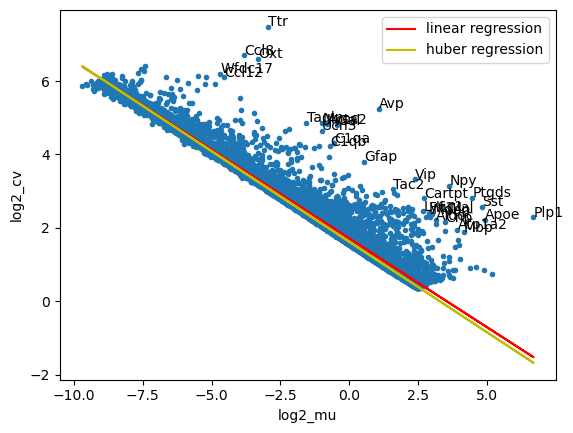

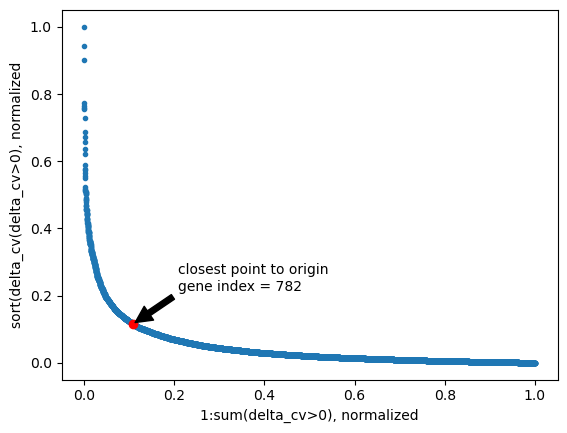

column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


In [565]:
%matplotlib inline
amy_df = amy_df.astype('int')
#process using standard workflow/functions from dimorph_processing.py
amy_df_bool = amy_df.mask(amy_df>0, other = 1)
status_df = dp.intialize_status_df()
amy_df_ce, amy_df_bool, amy_metadata_df_subset, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = amy_metadata_df_subset,
                                                      df_bool = amy_df_bool,
                                                      df = amy_df,
                                                      status_df = status_df)
amy_df_ce_ge, amy_df_bool, amy_metadata_df_subset, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=amy_df_bool,
                                                 df = amy_df_ce,
                                                 meta_data_df = amy_metadata_df_subset,
                                                 status_df = status_df)

amy_cv_df, amy_df_n = dp.analyze_cv(df = amy_df_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
amy_gene_index, amy_df_ce_ge_cv, status_df = dp.get_top_cv_genes(df = amy_df_ce_ge, cv_df=amy_cv_df, plot_flag=1, status_df=status_df)
amy_cv_ls_arr,status_df = dp.log_and_standerdize_df(amy_df_ce_ge_cv,status_df)
amy_df_ce_ge_cv_ls = pd.DataFrame(data=amy_cv_ls_arr.T, index=amy_df_ce_ge_cv.index, columns=amy_df_ce_ge_cv.columns)


Total cells reduced from 36706 to 26661
(27874, 26661)
Total genes reduced from 27874 to 16297
(16297, 26661)


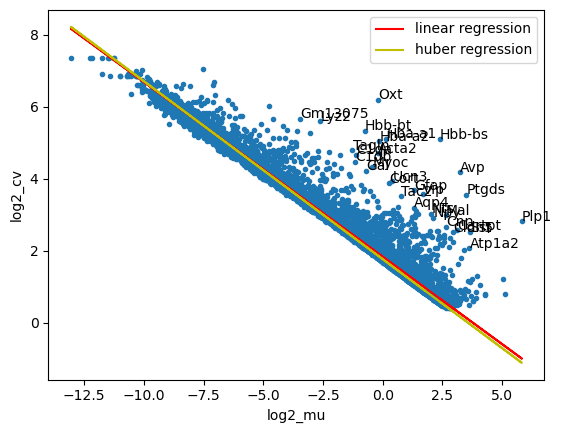

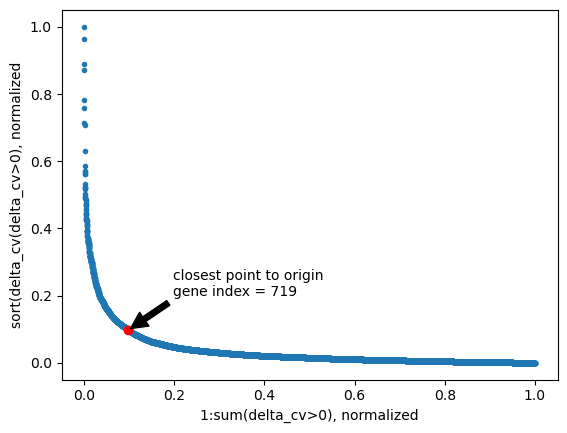

(719, 26661)
column (gene) mean after standardization: 0.00
column (gene) sigma after standardization: 1.00


In [566]:
sd_df = sd_df.astype('int')
#process using standard workflow/functions from dimorph_processing.py
sd_df_bool = sd_df.mask(sd_df>0, other = 1)
status_df = dp.intialize_status_df()
sd_df_ce, df_bool, sd_metadata_df_subset, status_df = dp.cell_exclusion(threshold_m = 2500, 
                                                      threshold_g = 2000,
                                                      meta_data_df = sd_metadata_df_subset,
                                                      df_bool = sd_df_bool,
                                                      df = sd_df,
                                                      status_df = status_df)
print (sd_df_ce.shape)
sd_df_ce_ge, sd_df_bool, sd_metadata_df_subset, status_df = dp.gene_exclusion(num_cell_lwr_bound=10,
                                                  percent_cell_upper_bound=50,
                                                 df_bool=sd_df_bool,
                                                 df = sd_df_ce,
                                                 meta_data_df = sd_metadata_df_subset,
                                                 status_df = status_df)
print (sd_df_ce_ge.shape)
sd_cv_df, sd_df_n = dp.analyze_cv(df = sd_df_ce_ge,
                  norm_scale_factor=20000,
                  num_top_genes=30,
                  plot_flag=1,
                 use_huber = True)
sd_gene_index, sd_df_ce_ge_cv, status_df = dp.get_top_cv_genes(df = sd_df_ce_ge, cv_df=sd_cv_df, plot_flag=1, status_df=status_df)
print (sd_df_ce_ge_cv.shape)
sd_cv_ls_arr,status_df = dp.log_and_standerdize_df(sd_df_ce_ge_cv,status_df)
sd_df_ce_ge_cv_ls = pd.DataFrame(data=sd_cv_ls_arr.T, index=sd_df_ce_ge_cv.index, columns=sd_df_ce_ge_cv.columns)

In [371]:
amy_df_ce_ge_cv_ls.shape

(782, 34961)

In [374]:
amy_df_ce_ge_cv_ls.index

Index(['Ttr', 'Avp', 'Plp1', 'Ptgds', 'Oxt', 'Sst', 'Npy', 'Ccl8', 'Apoe',
       'Gal',
       ...
       'Trim54', 'Acvr1c', 'Adgrg6', 'Litaf', 'Gm26772', 'Txnip', 'Rora',
       'Cd84', 'Gjb1', 'Utrn'],
      dtype='object', name='cellID', length=782)

In [372]:
sd_df_ce_ge_cv_ls.shape

(719, 26661)

In [375]:
sd_df_ce_ge_cv_ls.index

Index(['Hbb-bs', 'Oxt', 'Avp', 'Plp1', 'Ptgds', 'Hba-a1', 'Hba-a2', 'Hbb-bt',
       'Acta2', 'Vip',
       ...
       'AI464131', 'Tek', 'Padi2', 'Gm16160', 'Zcchc24', 'Tmem125', 'Rasgrp3',
       'Tnr', 'Prox1os', 'Ctxn3'],
      dtype='object', name='gene', length=719)

In [367]:
#recombine using intersected genes

In [368]:
intersected_gene_ind_cv = amy_df_ce_ge_cv_ls.index.intersection(sd_df_ce_ge_cv_ls.index)

In [369]:
intersected_gene_ind_cv

Index(['Avp', 'Plp1', 'Ptgds', 'Oxt', 'Sst', 'Npy', 'Gal', 'Vip', 'Acta2',
       'Myoc',
       ...
       'AF251705', 'Adamts1', 'Aurkb', 'Xaf1', 'Gamt', 'Npas3', 'Bcl2a1b',
       'Litaf', 'Gm26772', 'Gjb1'],
      dtype='object', length=574)

In [255]:
amy_df_ce_ge_cv_ls = amy_df_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)
sd_df_ce_ge_cv_ls = sd_df_ce_ge_cv_ls.reindex(index = intersected_gene_ind_cv)

In [256]:
amy_df_ce_ge_cv_ls.shape

(574, 34961)

In [257]:
sd_df_ce_ge_cv_ls.shape

(574, 26661)

In [567]:
#try using union instead of intersection
union_gene_ind_cv = amy_df_ce_ge_cv_ls.index.union(sd_df_ce_ge_cv_ls.index)
union_gene_ind_cv

Index(['1500015O10Rik', '1700031P21Rik', '1700047M11Rik', '1810011O10Rik',
       '2310022B05Rik', '2700038G22Rik', '2810417H13Rik', '2900052N01Rik',
       '2900055J20Rik', '3110035E14Rik',
       ...
       'Wfs1', 'Xaf1', 'Yjefn3', 'Zbtb18', 'Zcchc24', 'Zfhx3', 'Zfp36',
       'Zfp36l1', 'Zic1', 'Zmat4'],
      dtype='object', length=927)

In [568]:
amy_df_union = amy_df_ce.reindex(index = union_gene_ind_cv)
sd_df_union = sd_df_ce.reindex(index = union_gene_ind_cv)

In [569]:
amy_df_union.shape

(927, 34961)

In [570]:
#concat values to single array
amy_sd_df_union = pd.concat([amy_df_union,sd_df_union],axis=1)
amy_sd_df_union.shape

(927, 61622)

In [571]:
amy_sd_df_union_ls_arr,status_df = dp.log_and_standerdize_df(amy_sd_df_union,status_df)
amy_sd_df_union_ls = pd.DataFrame(data=amy_sd_df_union_ls_arr.T, index=amy_sd_df_union.index, columns=amy_sd_df_union.columns)

column (gene) mean after standardization: -0.00
column (gene) sigma after standardization: 1.00


In [380]:
amy_sd_df_union_ls.shape

(927, 61622)

In [258]:
amy_sd_df_ce_ge_cv_ls = pd.concat([amy_df_ce_ge_cv_ls,sd_df_ce_ge_cv_ls], axis = 1)

In [69]:
amy_sd_df_ce_ge_cv_ls.shape

(574, 61622)

In [31]:
#concat metadata to single df

In [572]:
amy_sd_metadata_df = pd.concat([amy_metadata_df_subset,sd_metadata_df_subset],axis=1)
amy_sd_metadata_df.shape

(5, 61622)

In [573]:
np.all(amy_sd_metadata_df.columns == amy_sd_df_ce_ge_cv_ls.columns)

True

In [574]:
np.all(amy_sd_metadata_df.columns == amy_sd_df_union_ls.columns)

True

In [ ]:
log_std_arr = amy_sd_df_ce_ge_cv_ls.values.T

In [575]:
log_std_arr = amy_sd_df_union_ls.values.T

3) PCA Dimensionality Reduction, using find knee to get cutoff 

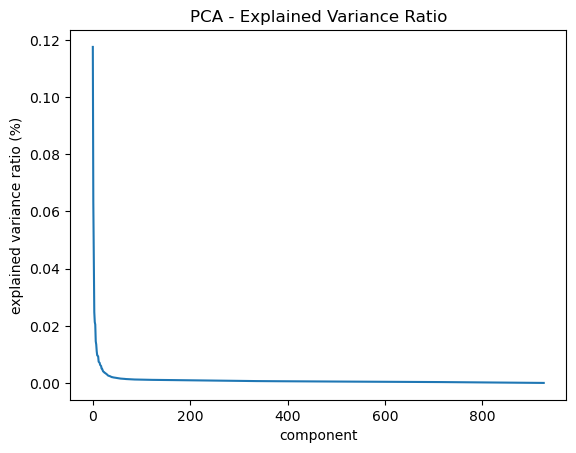

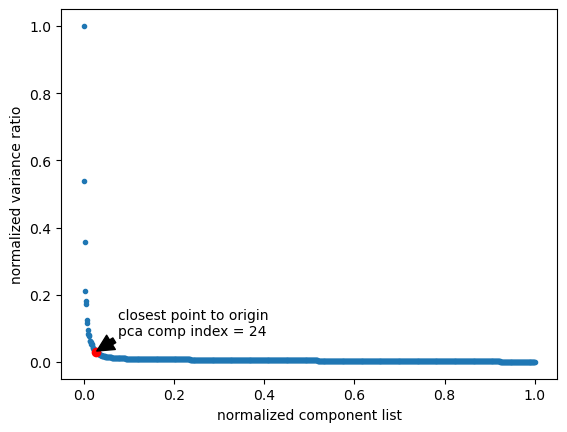

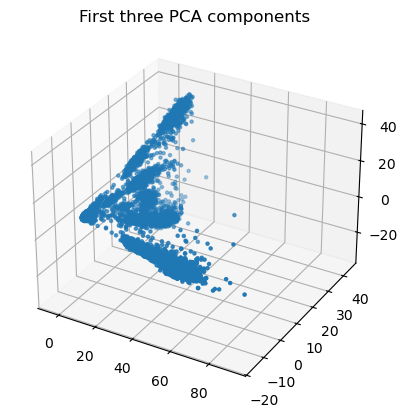

In [576]:
pca_index, arr_pca, status_df = dp.analyze_pca(arr = log_std_arr, #log_std_arr
                                               n_components=log_std_arr.shape[1], #log_std_arr.shape[1]
                                               optimize_n=True,
                                               plot_flag=1, 
                                               status_df=status_df)

In [384]:
arr_pca.shape

(61622, 24)

In [385]:
np.save('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/arr_pca_union.npy',arr_pca)

In [386]:
amy_sd_metadata_df.index

Index(['cell_class', 'markers', 'full_name', 'dataset'], dtype='object')

In [577]:
meta_data_df_pca = amy_sd_metadata_df.T.copy()

In [578]:
meta_data_df_pca.shape

(61622, 5)

In [579]:
meta_data_df_pca

,cell_class,markers,full_name,SampleID,dataset
TGGGAAGGTCGAGTGA-1_08-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X08_1,amy
AAAGTCCAGTACCATC-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
ATATCCTCAAAGGATT-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
CGAGTTACATCCTTCG-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
GGACGTCCACCCATAA-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
...,...,...,...,...,...
GAGAGGTCACATCATG-1_10X37_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X37_2,sd
ATCAGGTTCCACTAGA-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X35_2,sd
TCCACGTAGAGCATCG-1_10X37_1,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X37_1,sd
CTGCGAGCACTACGGC-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X35_2,sd


In [524]:
amy_metadata_df_dd_order_fmt

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm


In [536]:
amy_metadata_df_dd_order_fmt.loc['sample']

TGGGAAGGTCGAGTGA-1_08-1    08-1
AAAGTCCAGTACCATC-1_10-1    10-1
ATATCCTCAAAGGATT-1_10-1    10-1
CGAGTTACATCCTTCG-1_10-1    10-1
GGACGTCCACCCATAA-1_10-1    10-1
                           ... 
CTCATCGTCACCCATC-1_76-2    76-2
CTGCCATGTATCGCTA-1_76-2    76-2
GCATGATTCTCGTCGT-1_76-2    76-2
TGGGCGTAGAAGCCAC-1_76-2    76-2
TTCTGTAGTGGTATGG-1_76-2    76-2
Name: sample, Length: 55514, dtype: object

In [546]:
SampleIDs = []
for x in list(amy_metadata_df_dd_order_fmt.loc['sample']):
    x = x.replace('-','_')
    x = '10X' + x
    SampleIDs.append(x)
#SampleIDs

In [554]:
len(SampleIDs)

55514

In [543]:
amy_metadata_df_dd_order_fmt.loc['SampleID']= SampleIDs

In [548]:
amy_metadata_df_dd_order_fmt

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,TCGAACAAGGAGCTGT-1_76-1,TGTACAGTCTGCAGCG-1_76-1,AGGACTTTCATGGAGG-1_76-2,CCCATTGGTACCTAGT-1_76-2,CTATCTACAATTGCTG-1_76-2,CTCATCGTCACCCATC-1_76-2,CTGCCATGTATCGCTA-1_76-2,GCATGATTCTCGTCGT-1_76-2,TGGGCGTAGAAGCCAC-1_76-2,TTCTGTAGTGGTATGG-1_76-2
celltype,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
sample,08-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,10-1,...,76-1,76-1,76-2,76-2,76-2,76-2,76-2,76-2,76-2,76-2
FC time,0,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
batch,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm,pvm
full_name,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,GABA-1-Foxp2-Fmod,...,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm,Nonneuronal-14-pvm
SampleID,10X08_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,10X10_1,...,10X76_1,10X76_1,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2,10X76_2


In [580]:
meta_data_df_pca

,cell_class,markers,full_name,SampleID,dataset
TGGGAAGGTCGAGTGA-1_08-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X08_1,amy
AAAGTCCAGTACCATC-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
ATATCCTCAAAGGATT-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
CGAGTTACATCCTTCG-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
GGACGTCCACCCATAA-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
...,...,...,...,...,...
GAGAGGTCACATCATG-1_10X37_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X37_2,sd
ATCAGGTTCCACTAGA-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X35_2,sd
TCCACGTAGAGCATCG-1_10X37_1,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X37_1,sd
CTGCGAGCACTACGGC-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X35_2,sd


4) Harmony Integration, with vars_use = dataset, iterate until convergence

In [581]:
#vars_use = ['dataset']
#try using sample_id instead of dataset
vars_use = ['SampleID']
ho = hm.run_harmony(arr_pca,meta_data_df_pca,vars_use,max_iter_harmony=20)

2025-05-13 12:48:35,330 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-05-13 12:48:39,252 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-05-13 12:48:39,604 - harmonypy - INFO - Iteration 1 of 20
2025-05-13 12:49:01,123 - harmonypy - INFO - Iteration 2 of 20
2025-05-13 12:49:22,138 - harmonypy - INFO - Iteration 3 of 20
2025-05-13 12:49:43,171 - harmonypy - INFO - Iteration 4 of 20
2025-05-13 12:50:03,919 - harmonypy - INFO - Iteration 5 of 20
2025-05-13 12:50:25,102 - harmonypy - INFO - Iteration 6 of 20
2025-05-13 12:50:45,692 - harmonypy - INFO - Iteration 7 of 20
2025-05-13 12:51:06,240 - harmonypy - INFO - Iteration 8 of 20
2025-05-13 12:51:26,920 - harmonypy - INFO - Iteration 9 of 20
2025-05-13 12:51:47,431 - harmonypy - INFO - Iteration 10 of 20
2025-05-13 12:52:07,966 - harmonypy - INFO - Converged after 10 iterations


5) Run Tsne 

In [582]:
arr_pca.shape

(61622, 24)

In [583]:
amy_sd_hm_arr = ho.Z_corr.T

In [584]:
#save harmony correctted PCA arr
np.save('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/amy_sd_hm_arr_union_sampleid.npy',amy_sd_hm_arr)

In [585]:
amy_sd_hm_arr.shape

(61622, 24)

In [586]:
amy_sd_hm_arr.shape[0]//12

5135

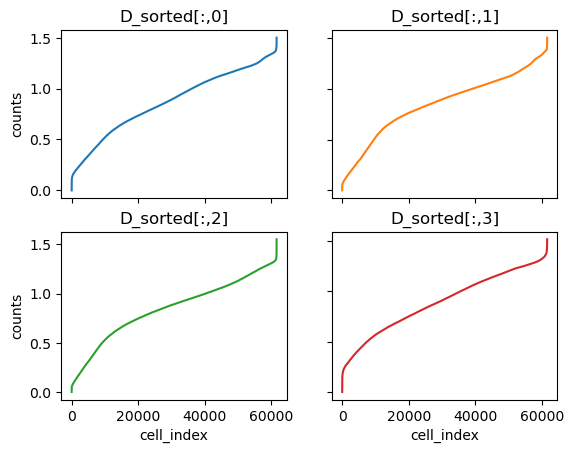

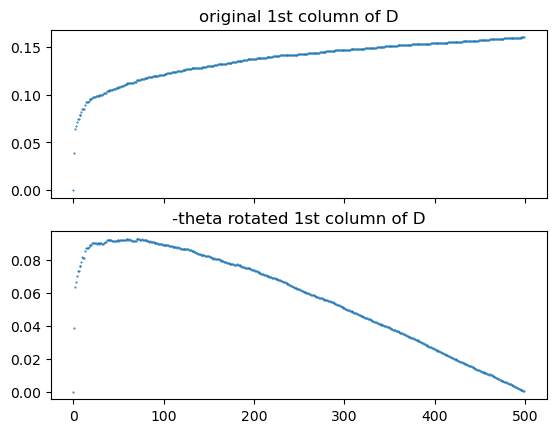

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 5135
early_exaggeration: 20
init: pca
perplexity: 55.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


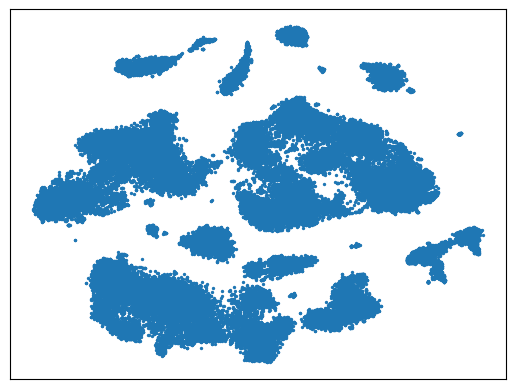

In [587]:
amy_sd_hm_arr = ho.Z_corr.T

perplexity,status_df = dp.get_perplexity(pca_arr = amy_sd_hm_arr, cutoff=500, plot_flag=1, status_df = status_df)

amy_sd_arr_tsne,status_df = dp.do_tsne(arr = amy_sd_hm_arr, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=amy_sd_hm_arr.shape[0]//12,
                               early_exaggeration=20,
                               init='pca', 
                               perplexity = perplexity,
                               metric='correlation',
                               status_df = status_df)

In [399]:
meta_data_df_pca.shape

(61622, 4)

In [588]:
meta_data_df_pca.to_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/meta_data_df_pca_union_sampleid.json')

In [589]:
amy_sd_hm_arr.shape

(61622, 24)

In [590]:
amy_sd_arr_tsne.shape

(61622, 2)

In [41]:
out_folder = '/bigdata/isaac/sd_amy_tsne_harmony_comp/v4_aic/'
#out_folder = '/bigdata/isaac/sd_amy_tsne_harmony_comp/v3_updated_sd_celltypes/'

In [134]:
out_folder

'/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/'

In [591]:
#save intermediate results
np.save(out_folder + 'amy_sd_arr_tsne_union_sampleid.npy',amy_sd_arr_tsne)
#meta_data_df_pca.to_json(out_folder +'meta_data_df_pca.json')

In [43]:
amy_sd_df_ce_ge_cv_ls.to_feather(out_folder + 'amy_sd_df_ce_ge_cv_ls.feather')
amy_sd_metadata_df_ce_ge_cv_ls.to_json(out_folder + 'amy_sd_metadata_df_ce_ge_cv_ls.json')

color each cell by dataset

In [48]:
out_folder = '/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/'

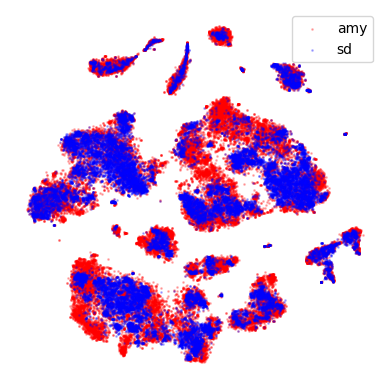

In [592]:
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#ax.scatter(x,y,s=2)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=1,c = 'r', label = 'amy',alpha=.25)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=1,c = 'b', label = 'sd',alpha=0.25)


ax.set_xticks([])
ax.set_yticks([])

ax.legend()
ax.axis('off')
ax.set_box_aspect(1)
plt.savefig(out_folder + 'tsne_overlay_sd_on_amy_union_sampleid.pdf')
plt.show()

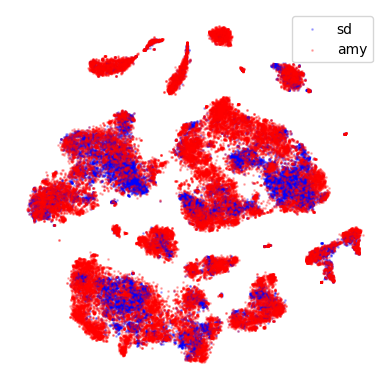

In [593]:
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#ax.scatter(x,y,s=2)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=1,c = 'b', label = 'sd',alpha=.25)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=1,c = 'r', label = 'amy',alpha=.25)

ax.set_xticks([])
ax.set_yticks([])

ax.legend()
ax.axis('off')
ax.set_box_aspect(1)
plt.savefig(out_folder + 'tsne_overlay_amy_on_sd_union_sampleid.pdf')
plt.show()

compare tsne overlay of non harmonized verison

In [383]:
amy_sd_hm_arr.shape

(61739, 20)

In [384]:
arr_pca.shape

(61739, 20)

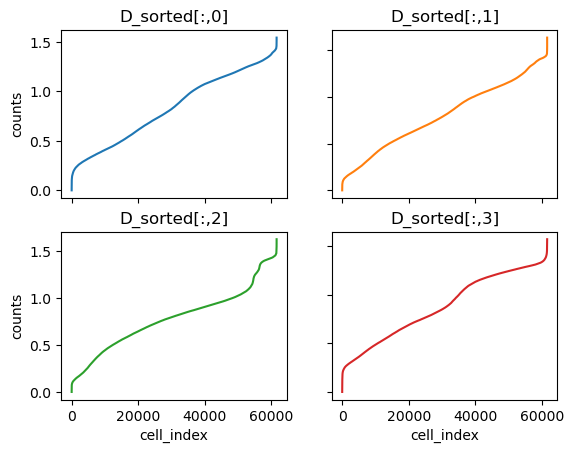

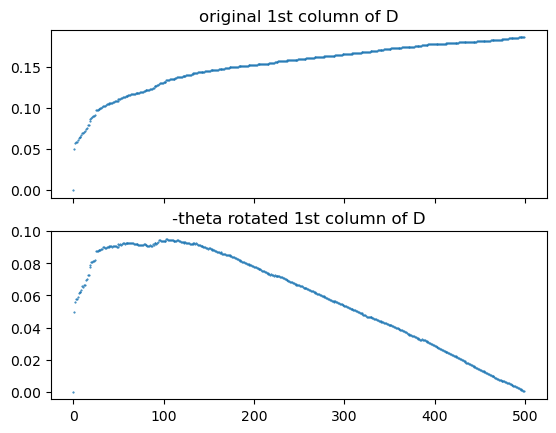

creating tsne object with the following parameters: 
n_components:2
n_iter: 1000
learning_rate: 5135
early_exaggeration: 20
init: pca
perplexity: 62.0


/home/isaac/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


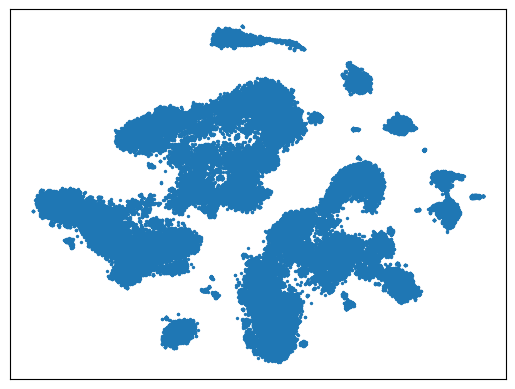

In [58]:
perplexity,status_df = dp.get_perplexity(pca_arr = arr_pca, cutoff=500, plot_flag=1, status_df = status_df)

amy_sd_arr_tsne_pca_input,status_df = dp.do_tsne(arr = arr_pca, 
                               n_components=2,
                               n_iter=1000,
                               learning_rate=arr_pca.shape[0]//12,
                               early_exaggeration=20,
                               init='pca', 
                               perplexity = perplexity,
                               metric='correlation',
                               status_df = status_df)

In [50]:
np.save(out_folder + 'amy_sd_arr_tsne_pca_input.npy',amy_sd_arr_tsne_pca_input)

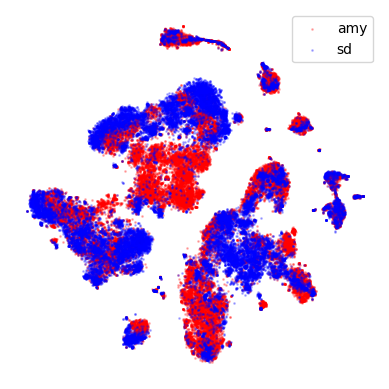

In [ ]:
%matplotlib inline
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne_pca_input[:,0]
y = amy_sd_arr_tsne_pca_input[:,1]
#ax.scatter(x,y,s=2)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=1,c = 'r', label = 'amy',alpha=.25)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=1,c = 'b', label = 'sd',alpha=0.25)


ax.set_xticks([])
ax.set_yticks([])

ax.legend()
ax.axis('off')
ax.set_box_aspect(1)
plt.savefig(out_folder + 'tsne_overlay_sd_on_amy_no_harmony.pdf')
plt.show()

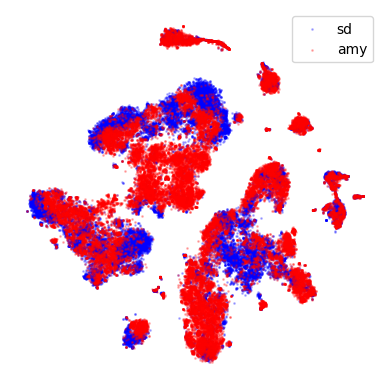

In [ ]:
fig,ax = plt.subplots()
#all pts
x = amy_sd_arr_tsne_pca_input[:,0]
y = amy_sd_arr_tsne_pca_input[:,1]
#ax.scatter(x,y,s=2)

#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
ax.scatter(x_sd,y_sd,s=1,c = 'b', label = 'sd',alpha=.25)

#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
ax.scatter(x_amy,y_amy,s=1,c = 'r', label = 'amy',alpha=.25)

ax.set_xticks([])
ax.set_yticks([])

ax.legend()
ax.axis('off')
ax.set_box_aspect(1)
plt.savefig(out_folder + 'tsne_overlay_amy_on_sd_no_harmony.pdf')
plt.show()

color each cell in the SD dataset by the match cell type in the FC dataset

In [389]:
updated_amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))
updated_amy_classes

['GABA', 'Nonneuronal', 'VGLUT1', 'VGLUT2']

In [390]:
amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))
amy_classes

['GABA', 'Nonneuronal', 'VGLUT1', 'VGLUT2']

In [257]:
amy_metadata_df_subset = amy_metadata_df_subset_gaba_glut.copy()

In [64]:
out_folder

'/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/'

In [ ]:
#load files

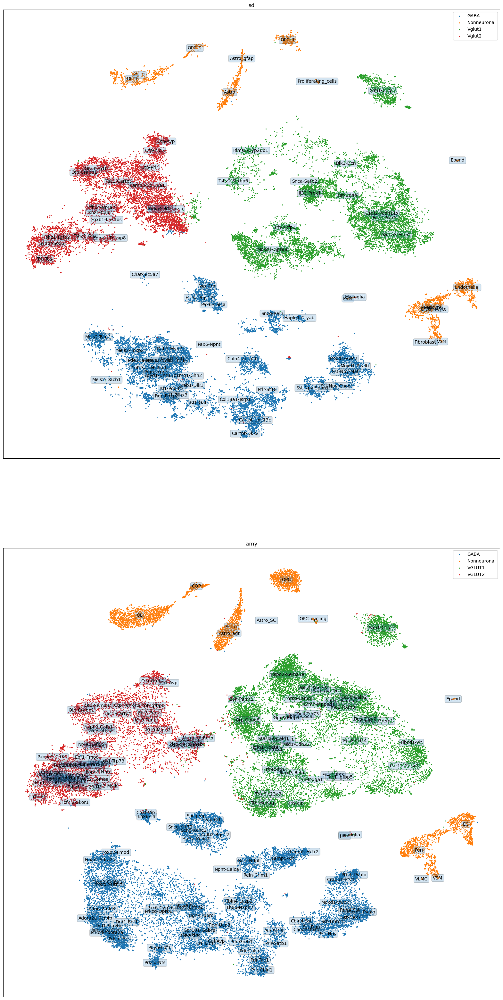

In [594]:
#get cell type labels for each dataset 
sd_labels = list(np.unique(sd_metadata_df_subset.loc['markers']))
amy_labels = list(np.unique(amy_metadata_df_subset.loc['markers']))

#get class labels for each dataset
sd_classes = list(np.unique(sd_metadata_df_subset.loc['cell_class']))
updated_amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))

###############################################
fig,ax = plt.subplots(2,1, figsize = (20,40))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
##############################################
#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
#ax[0].scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=.25)
for sd_cls in sd_classes:
    ax[0].scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls))

#combine into 2D array
arr_xy_sd = np.vstack([x_sd,y_sd])
for sd_ct in sd_labels:
    #print (arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct])
    cluster_median = np.median(arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct],axis = 0)
    ax[0].annotate(text = sd_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].set_title('sd')
ax[0].legend()
###############################################
#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
#ax[1].scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=.25)
for amy_cls in updated_amy_classes:
    ax[1].scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls))

#combine into 2D array
arr_xy_amy = np.vstack([x_amy,y_amy])
for amy_ct in amy_labels:
    #print (arr_xy_amy.T[amy_metadata_df_subset.T['markers']==amy_ct])
    cluster_median = np.median(arr_xy_amy.T[amy_metadata_df_subset.T['markers']==amy_ct],axis = 0)
    ax[1].annotate(text = amy_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].legend()
ax[1].set_title('amy')

plt.savefig(out_folder + 'ctype_cclass_sd_amy_comparison_union_sampleid.pdf')
plt.show()

In [352]:
#individual versions

In [259]:
amy_metadata_df_subset.loc['full_name']

TGGGAAGGTCGAGTGA-1_08-1       GABA-1-Foxp2_Fmod
AAAGTCCAGTACCATC-1_10-1       GABA-1-Foxp2_Fmod
ATATCCTCAAAGGATT-1_10-1       GABA-1-Foxp2_Fmod
CGAGTTACATCCTTCG-1_10-1       GABA-1-Foxp2_Fmod
GGACGTCCACCCATAA-1_10-1       GABA-1-Foxp2_Fmod
                                   ...         
GTGATGTAGGTTTACC-1_76-2    VGLUT2-42-Otp_Sema3c
TCATTCAGTGTTAAAG-1_76-2    VGLUT2-42-Otp_Sema3c
TCCACGTCACTTCATT-1_76-2    VGLUT2-42-Otp_Sema3c
TTACCGCGTCACAATC-1_76-2    VGLUT2-42-Otp_Sema3c
TTTATGCCAGTATTCG-1_76-2    VGLUT2-42-Otp_Sema3c
Name: full_name, Length: 30184, dtype: object

In [260]:
amy_labels = list(np.unique(amy_metadata_df_subset.loc['full_name']))
amy_labels

['GABA-1-Foxp2_Fmod',
 'GABA-10-Prkcd-Adora2a',
 'GABA-11-Adora2a-Id4',
 'GABA-12-Adora2a-Scn4b',
 'GABA-13-Adora2a-Crh',
 'GABA-14-Drd1-Scn4b',
 'GABA-15-Drd1-Ebf1',
 'GABA-16-Prkcd-Nts',
 'GABA-17-Pdyn-Ebf1',
 'GABA-18-Isl1-Tac1',
 'GABA-19-Isl1-Aldoc',
 'GABA-2-Foxp2_Adra2a',
 'GABA-20-Gpr101-Gabre',
 'GABA-21-Vdr-Nts',
 'GABA-22-Gal-Avp',
 'GABA-23-Fign-Lrpprc',
 'GABA-24-Fign-Ucn3',
 'GABA-25-Lhx8-Th',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-28-Cbln4-Luzp2',
 'GABA-29-Prlr-Greb1',
 'GABA-3-Foxp2_Col6a1',
 'GABA-30-Prlr-Calcr',
 'GABA-31-Prlr-Cbln1',
 'GABA-32-Prlr-Tac1',
 'GABA-33-Prlr-St18',
 'GABA-34-Prlr-Satb1',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-37-Sst-Npy',
 'GABA-38-Sst-Tmtc4',
 'GABA-39-Sst-Nek7',
 'GABA-4-Foxp2_Htr1f',
 'GABA-40-Rpb4-Sst',
 'GABA-41-Moxd1-Pvalb',
 'GABA-42-Moxd1-Vwc2',
 'GABA-43-Crabp1-Etv1',
 'GABA-44-Pthlh-Pvalb',
 'GABA-45-Lamp5-Hctr2',
 'GABA-46-Lamp5-Kit',
 'GABA-47-Reln-Ndnf',
 'GABA-48-Reln-Crim1',
 'GABA-49-Npnt-Calca',

In [64]:
amy_metadata_df_subset_gaba_glut

,TGGGAAGGTCGAGTGA-1_08-1,AAAGTCCAGTACCATC-1_10-1,ATATCCTCAAAGGATT-1_10-1,CGAGTTACATCCTTCG-1_10-1,GGACGTCCACCCATAA-1_10-1,GGACGTCGTCCAATCA-1_10-1,GTCACGGCAATCGAAA-1_10-1,TATTTCGAGCAGCAGT-1_10-1,TCCGTGTTCCAATCTT-1_10-1,TCTACATTCTGCATGA-1_10-1,...,ACTATTCTCAAGAGTA-1_76-2,AGTAACCGTAAGTTGA-1_76-2,ATTTACCGTTTCCAAG-1_76-2,GAAGTAAGTTCACCGG-1_76-2,GGTTAACCACAGAAGC-1_76-2,GTGATGTAGGTTTACC-1_76-2,TCATTCAGTGTTAAAG-1_76-2,TCCACGTCACTTCATT-1_76-2,TTACCGCGTCACAATC-1_76-2,TTTATGCCAGTATTCG-1_76-2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2,VGLUT2
markers,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,Foxp2-Fmod,...,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c,Otp-Sema3c
full_name,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,GABA-1-Foxp2_Fmod,...,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c,VGLUT2-42-Otp_Sema3c
dataset,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy,...,amy,amy,amy,amy,amy,amy,amy,amy,amy,amy


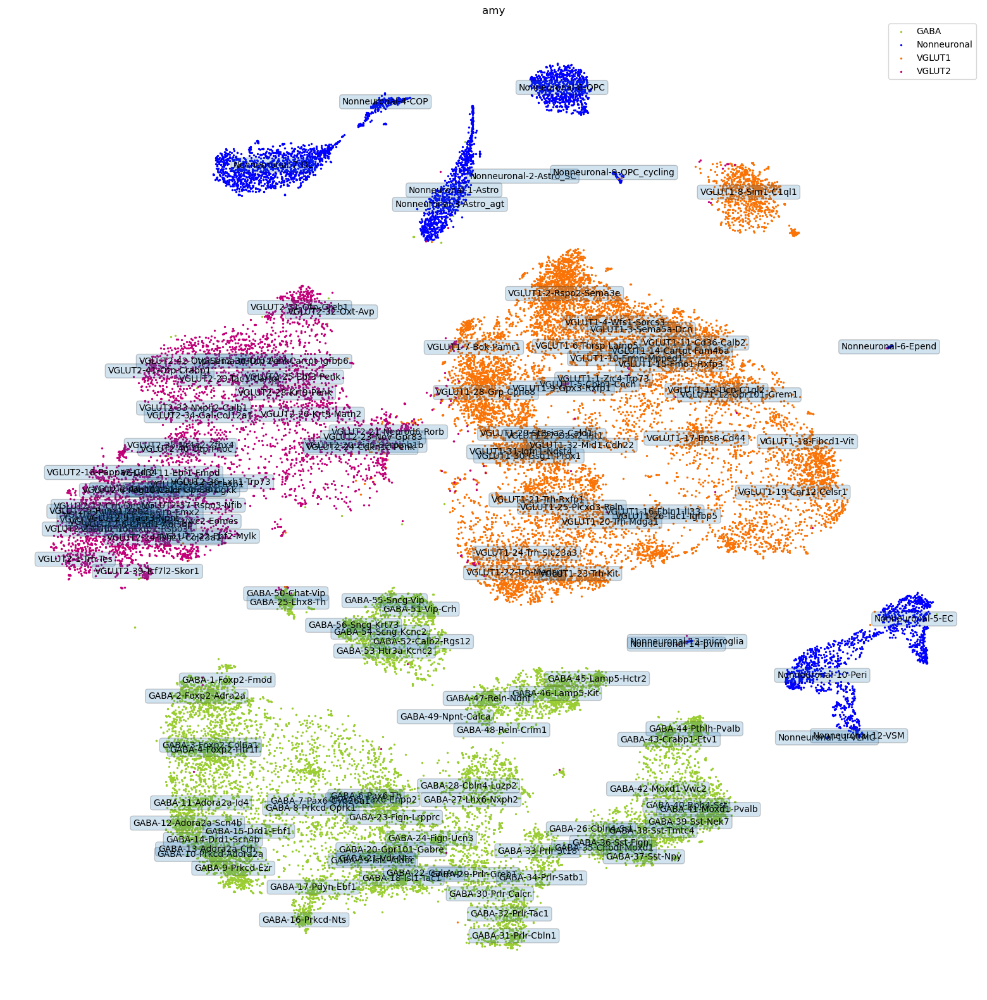

In [599]:
%matplotlib inline
#get cell type labels
amy_labels = list(np.unique(amy_metadata_df_subset.loc['full_name']))

#get class labels
updated_amy_classes = list(np.unique(amy_metadata_df_subset.loc['cell_class']))

fig,ax = plt.subplots(figsize = (20,20))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#amy pts
x_amy = x[meta_data_df_pca['dataset'] == 'amy']
y_amy = y[meta_data_df_pca['dataset'] == 'amy']
#ax.scatter(x_amy,y_amy,s=2,c = 'r', label = 'amy',alpha=.25)
for amy_cls in updated_amy_classes:
    #ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls))
    if amy_cls == 'GABA':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#9ACD32')
    if amy_cls == 'VGLUT1':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#F97306')
    if amy_cls == 'VGLUT2':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#C20078')
    if amy_cls == 'Nonneuronal':
        ax.scatter(x_amy[amy_metadata_df_subset.T['cell_class']==amy_cls],y_amy[amy_metadata_df_subset.T['cell_class']==amy_cls], s=2, label = str(amy_cls), c = '#0000FF')

    
#combine into 2D array
arr_xy_amy = np.vstack([x_amy,y_amy])
for amy_ct in amy_labels:
    #print (arr_xy_amy.T[amy_metadata_df_subset.T['markers']==amy_ct])
    cluster_median = np.median(arr_xy_amy.T[amy_metadata_df_subset.T['full_name']==amy_ct],axis = 0)
    ax.annotate(text = amy_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax.set_xticks([])
ax.set_yticks([])
ax.legend()
ax.set_title('amy')

ax.axis('off')
ax.set_box_aspect(1)
#plt.savefig(out_folder + 'ctype_cclass_amy_full_names.pdf')
plt.show()

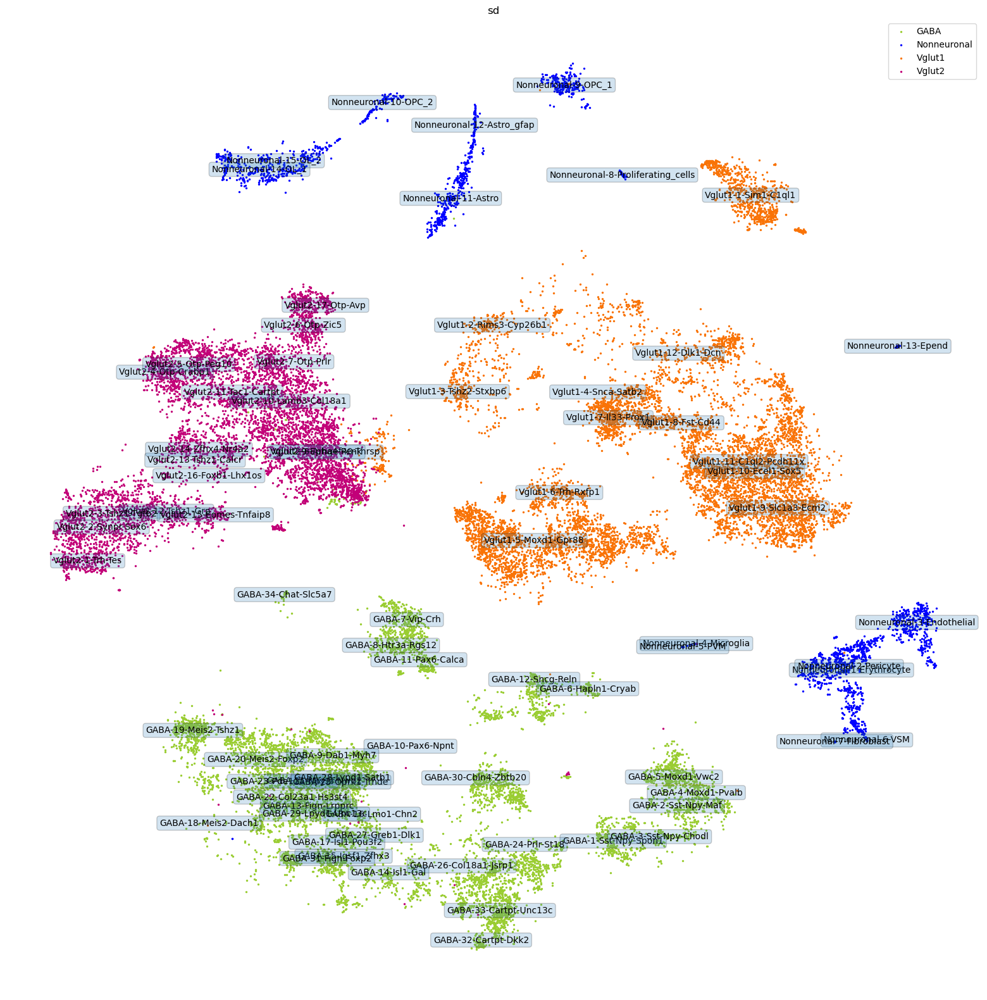

In [598]:
#get cell type labels
sd_labels = list(np.unique(sd_metadata_df_subset.loc['full_name']))

#get class labels
sd_classes = list(np.unique(sd_metadata_df_subset.loc['cell_class']))
#print (sd_classes)
fig,ax = plt.subplots(figsize = (20,20))
#label fontsize
label_fs = 10
#all pts
x = amy_sd_arr_tsne[:,0]
y = amy_sd_arr_tsne[:,1]
#sd pts
x_sd = x[meta_data_df_pca['dataset'] == 'sd']
y_sd = y[meta_data_df_pca['dataset'] == 'sd']
#ax.scatter(x_sd,y_sd,s=2,c = 'b', label = 'sd',alpha=.25)
for sd_cls in sd_classes:
    #ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls))
    if sd_cls == 'GABA':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#9ACD32')
    if sd_cls == 'Vglut1':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#F97306')
    if sd_cls == 'Vglut2':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#C20078')
    if sd_cls == 'Nonneuronal':
        ax.scatter(x_sd[sd_metadata_df_subset.T['cell_class']==sd_cls],y_sd[sd_metadata_df_subset.T['cell_class']==sd_cls], s=2, label = str(sd_cls), c = '#0000FF')

#combine into 2D array
arr_xy_sd = np.vstack([x_sd,y_sd])
for sd_ct in sd_labels:
    #print (arr_xy_sd.T[sd_metadata_df_subset.T['markers']==sd_ct])
    cluster_median = np.median(arr_xy_sd.T[sd_metadata_df_subset.T['full_name']==sd_ct],axis = 0)
    ax.annotate(text = sd_ct, xy=cluster_median, fontsize=label_fs, color='black',
                    ha='center', va='center', bbox=dict(boxstyle='round', alpha=0.2))
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('sd')
ax.legend()
ax.axis('off')
ax.set_box_aspect(1)

#plt.savefig(out_folder + 'ctype_cclass_sd_full_names.pdf')
plt.show()

## Majority vote to get cell types of SD using Amy cell types (USING TSNE OUTPUT)

In [600]:
arr_xy_amy

array([[-56.89804 , -65.020454, -59.82829 , ...,  46.427597,  46.432922,
         46.494377],
       [-35.22218 , -39.57315 , -42.339485, ..., -25.858332, -25.857506,
        -25.843006]], dtype=float32)

In [601]:
arr_xy_sd

array([[ 29.583052,  39.639385,  16.1181  , ..., -34.74333 , -35.396976,
        -31.320707],
       [-70.042725, -56.90489 , -76.3476  , ...,  89.08901 ,  89.61978 ,
         91.15958 ]], dtype=float32)

In [72]:
sd_metadata_df_subset

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


Cell below runs majority vote / label transfer algorithm on harmonized tsne output, using a predefined distance threshold to determine nearest neighbors

In [606]:
tmp = sd_metadata_df_subset.copy()

In [610]:
tmp

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2
SampleID,10X52_3,10X52_2,10X52_2,10X52_3,10X51_2,10X52_1,10X51_2,10X35_1,10X36_2,10X38_2,...,10X37_1,10X36_2,10X36_2,10X35_1,10X35_1,10X37_2,10X35_2,10X37_1,10X35_2,10X37_1
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


In [616]:
tmp = tmp.drop(index = 'SampleID')
tmp

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd


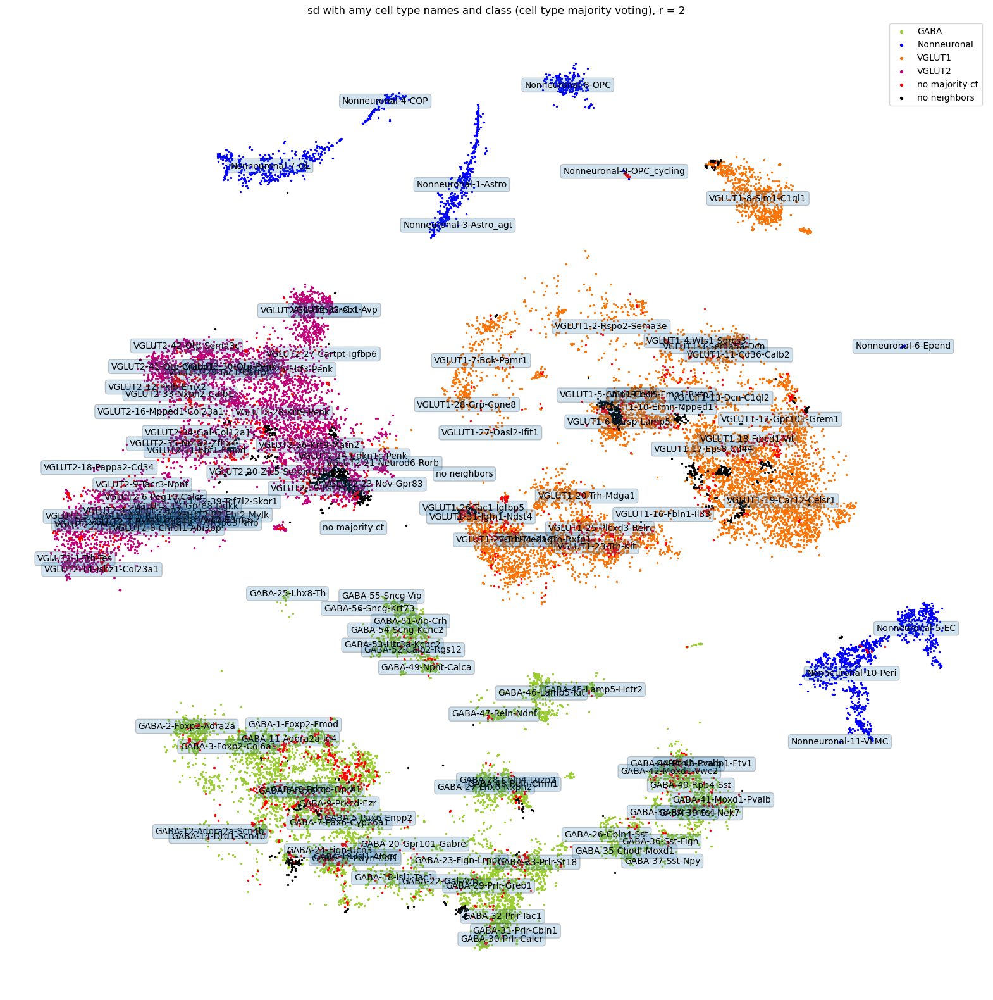

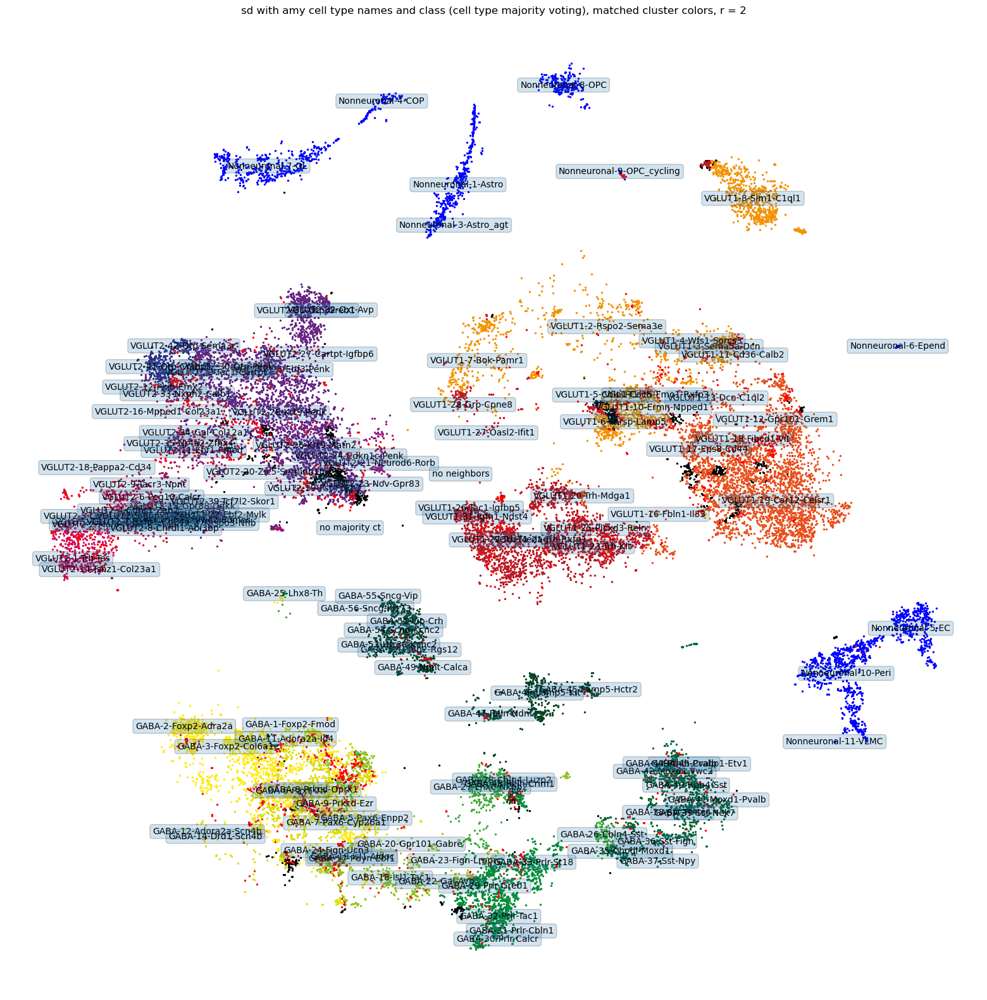

In [617]:
distance_threshold = 2

#prepare label transferred version of sd_metadata_df
sd_metadata_df_subset_w_amc = sd_metadata_df_subset.copy()
amy_markers = pd.DataFrame(index = ['amy_markers'], columns = sd_metadata_df_subset_w_amc.columns)
amy_class = pd.DataFrame(index = ['amy_class'], columns = sd_metadata_df_subset_w_amc.columns)
amy_full_name = pd.DataFrame(index = ['amy_full_name'], columns = sd_metadata_df_subset_w_amc.columns)

sd_metadata_df_subset_w_amc = pd.concat([sd_metadata_df_subset_w_amc,amy_class])
sd_metadata_df_subset_w_amc = pd.concat([sd_metadata_df_subset_w_amc,amy_markers])
sd_metadata_df_subset_w_amc = pd.concat([sd_metadata_df_subset_w_amc,amy_full_name])

sd_metadata_df_subset_w_amc_tmp = sd_metadata_df_subset.copy()
amy_markers = pd.DataFrame(index = ['amy_markers'], columns = sd_metadata_df_subset_w_amc_tmp.columns)
amy_class = pd.DataFrame(index = ['amy_class'], columns = sd_metadata_df_subset_w_amc_tmp.columns)

def cluster_transfer_majority_vote(arr_xy_sd,arr_xy_amy,distance_threshold,sd_metadata_df_subset,amy_metadata_df_subset):
    '''takes 2, 2D tsne x/y arrays, iterates through each point of arr1, finds all neighbors within distance_threshold. If more than
    10 neighbors, uses first 10. For each pts with at least 5 neighbors, uses index to count representation of cell types in metadata_df, 
    and performs majority voting to assign cell type and cell class.'''
    #drop sample id row if present
    if 'SampleID' in sd_metadata_df_subset.index:
        sd_metadata_df_subset = sd_metadata_df_subset.drop(index = 'SampleID')
    # Convert to shape (n_points, 2) for easier iteration
    arr_xy_sd_points = np.column_stack((arr_xy_sd[0], arr_xy_sd[1]))
    arr_xy_amy_points = np.column_stack((arr_xy_amy[0], arr_xy_amy[1]))
    
    # Dictionary to store closest points for each point in arr_xy_sd
    closest_points = {}
    
    # Iterate through each point in arr_xy_sd
    for idx, point1 in enumerate(arr_xy_sd_points):
        # Calculate distances to all points in arr_xy_amy
        distances = np.sqrt((arr_xy_amy_points[:, 0] - point1[0])**2 + (arr_xy_amy_points[:, 1] - point1[1])**2)
        
        # Find indices where distances are within the threshold
        within_threshold_indices = np.where(distances <= distance_threshold)[0]
        
        # If more than 10 points meet the threshold, keep only the first 10
        if len(within_threshold_indices) > 10:
            within_threshold_indices = within_threshold_indices[:10]
        
        # Store the points within threshold distance
        closest_points[idx] = arr_xy_amy_points[within_threshold_indices]
    
        #only consider points with at least 5 neighbors
        if len (within_threshold_indices)>=5:
            #print (dict(Counter(list(amy_metadata_df_subset_tmp.iloc[1,within_threshold_indices]))))
            #create dict counting instances of each unique cell type
            amy_marker_count_dict = dict(Counter(list(amy_metadata_df_subset.iloc[1,within_threshold_indices])))
            amy_marker_count_dict_sorted = dict(sorted(amy_marker_count_dict.items(), key=lambda item: item[1], reverse=True))
        
            #simplest case, all points from same amy cell type that's not blank, mark as amy cell type
            if len(list(amy_marker_count_dict_sorted.values()))==1 and len(list(amy_marker_count_dict_sorted.keys())[0])>0: 
                #print ('here')
                #print (len(list(amy_marker_count_dict_sorted.keys())[0]))
                #print (list(amy_marker_count_dict_sorted.keys())[0])
                
                sd_metadata_df_subset.iloc[5,idx] = list(amy_marker_count_dict_sorted.keys())[0]
                
                #sd_metadata_df_subset.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
                    
            #in case of more than one cell type,
            elif len(list(amy_marker_count_dict_sorted.values()))>1:
                # with equal represenation in top 2 cell types, mark as 'no-majority'
                if list(amy_marker_count_dict_sorted.values())[0] == list(amy_marker_count_dict_sorted.values())[1]:
                    #print ('no majority')
                    sd_metadata_df_subset.iloc[5,idx] = 'no majority ct'
                    sd_metadata_df_subset.iloc[4,idx] = 'no majority ct'
                
                #use majority voting, i.e. grab first key with highest representation
                else:
                    sd_metadata_df_subset.iloc[5,idx] = list(amy_marker_count_dict_sorted.keys())[0]
                    
                    #sd_metadata_df_subset.iloc[4,idx] = list(amy_class_count_dict_sorted.keys())[0]
                    
        
        #in case where no neighbors found, mark as 'no neighbors'
        else:
            #print ('here')
            sd_metadata_df_subset.iloc[5,idx] = 'no neighbors'
            sd_metadata_df_subset.iloc[4,idx] = 'no neighbors'
        
    return sd_metadata_df_subset


sd_metadata_df_subset_w_amc = cluster_transfer_majority_vote(arr_xy_sd,arr_xy_amy,distance_threshold,sd_metadata_df_subset_w_amc,amy_metadata_df_subset)

am = np.array(pd.unique(amy_metadata_df_subset.loc['markers']))
afn = np.array(pd.unique(amy_metadata_df_subset.loc['full_name']))
ac = np.array(pd.unique(amy_metadata_df_subset.loc['cell_class']))

am_2_afn_dict = dict(zip(am,afn))

#add case handeling for no majority or no neighbors (set full name to the same thing)
am_2_afn_dict['no majority ct'] = 'no majority ct'
am_2_afn_dict['no neighbors'] = 'no neighbors'

fn_transferred = []
for x in sd_metadata_df_subset_w_amc.loc['amy_markers']: 
    fn_transferred.append(am_2_afn_dict[x])

#fill in missing rows 
sd_metadata_df_subset_w_amc.loc['amy_full_name'] = fn_transferred
#and finally, fill amy_class row using first part of amy_full_name
sd_metadata_df_subset_w_amc.loc['amy_class'] = [x.split('-')[0] for x in sd_metadata_df_subset_w_amc.loc['amy_full_name']]

sd_metadata_df_subset_w_amc.to_json(out_folder + 'sd_metadata_df_subset_w_amc_union_sampleid_r_' +str(distance_threshold) + '.json')

%matplotlib inline
thc.plot_transferred_cell_labels(sd_metadata_df_subset_w_amc,amy_sd_arr_tsne,meta_data_df_pca,
                                 distance_threshold,
                                 out_folder, 
                                 'ctype_cclass_sd_w_amy_names_mv_union_r_'+ str(distance_threshold) +'_sampleid',
                                 savefig=True)

amy_cluster_txt_files = '/bigdata/isaac/sd_amy_tsne_harmony_comp/amy_cluster_txt_files/'
'''
#match colors using amy color scheme
old_2_new_cluster_names = pd.read_csv(amy_cluster_txt_files + 'old_2_new_cluster_names.csv')
#remove single quotes from entries
old_2_new_cluster_names["old"] = old_2_new_cluster_names["old"].str.replace("'", "", regex=False)
old_2_new_cluster_names["new"] = old_2_new_cluster_names["new"].str.replace("'", "", regex=False)
#make consistent using '-' instead of '_' in naming convention
old_2_new_cluster_names['new'] = old_2_new_cluster_names["new"].str.replace("_", "-", regex=False)
#create dict old:new
old_2_new_amy_dict = dict(zip(old_2_new_cluster_names['old'],old_2_new_cluster_names['new']))
np.save('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/old_2_new_amy_dict.npy',old_2_new_amy_dict)
'''
old_2_new_amy_dict = np.load('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/old_2_new_amy_dict.npy', allow_pickle=True).item()

#get hexcoes
gaba_hcodes_row = thc.get_hcodes(amy_cluster_txt_files,'GABA-hexa.txt','GABA',old_2_new_amy_dict,sd_metadata_df_subset_w_amc)
vglut1_hcodes_row = thc.get_hcodes(amy_cluster_txt_files,'Glut1-hexa.txt','VGLUT1',old_2_new_amy_dict,sd_metadata_df_subset_w_amc)
vglut2_hcodes_row = thc.get_hcodes(amy_cluster_txt_files,'Glut2-hexa.txt','VGLUT2',old_2_new_amy_dict,sd_metadata_df_subset_w_amc)

all_hcodes_row = pd.concat([gaba_hcodes_row,vglut1_hcodes_row,vglut2_hcodes_row], axis = 1)

sd_metadata_df_subset_w_amc_hex = sd_metadata_df_subset_w_amc.copy()
sd_metadata_df_subset_w_amc_hex = pd.concat([sd_metadata_df_subset_w_amc_hex,all_hcodes_row])

#add colors for Nonneuronal, NA - no majority ct, and NA - no neighbors
sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['amy_class']=='Nonneuronal'] = '0000FF'
sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['amy_class']=='no majority ct'] = 'FF0000'
sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['amy_class']=='no neighbors'] = '000000'

sd_metadata_df_subset_w_amc_hex.to_json(out_folder + 'sd_metadata_df_subset_w_amc_hex_union_sampleid_r_' +str(distance_threshold) + '.json')

%matplotlib inline
thc.plot_transferred_cell_labels_hex(sd_metadata_df_subset_w_amc_hex,
                                 amy_sd_arr_tsne,
                                 meta_data_df_pca,
                                 distance_threshold,
                                 out_folder, 
                                 'ctype_cclass_sd_w_amy_names_union_r_'+ str(distance_threshold) +'sampleid_clusters_full_name',
                                 savefig=True)

# Cell Correspondence heatmap

Load files here

In [3]:
distance_threshold = 2
out_folder = '/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/'


In [ ]:
sd_metadata_df_subset_w_amc_hex = pd.read_json(out_folder + 'sd_metadata_df_subset_w_amc_hex_r_' +str(distance_threshold) + '.json')


In [17]:
amy_metadata_df_dd_order_fmt = pd.read_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/amy_metadata_df_dd_order_fmt.json')

In [7]:
sd_metadata_df_subset_w_amc_hex

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,Sst-Npy-Spon1,...,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
amy_markers,Chodl-Moxd1,Lamp5-Hctr2,Prlr-St18,Prlr-St18,Prlr-St18,Prlr-St18,Prlr-St18,Moxd1-Vwc2,Cbln4-Sst,Cbln4-Sst,...,OL,OL,OL,OL,OL,OL,OL,OL,OL,OL
amy_full_name,GABA-35-Chodl-Moxd1,GABA-45-Lamp5-Hctr2,GABA-33-Prlr-St18,GABA-33-Prlr-St18,GABA-33-Prlr-St18,GABA-33-Prlr-St18,GABA-33-Prlr-St18,GABA-42-Moxd1-Vwc2,GABA-26-Cbln4-Sst,GABA-26-Cbln4-Sst,...,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL
hexacode,026634,064423,008D39,008D39,008D39,008D39,008D39,026634,3CAA36,3CAA36,...,0000FF,0000FF,0000FF,0000FF,0000FF,0000FF,0000FF,0000FF,0000FF,0000FF


In [8]:

_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['cell_class',:]=='GABA'], return_index=True)
gaba_unique_hcodes = np.array(sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['cell_class',:]=='GABA'][np.sort(idx)])
gaba_unique_hcodes

/tmp/ipykernel_2499606/3964286585.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  gaba_unique_hcodes = np.array(sd_metadata_df_subset_w_amc_hex.loc['hexacode',sd_metadata_df_subset_w_amc_hex.loc['cell_class',:]=='GABA'][np.sort(idx)])


array(['026634', '064423', '008D39', '3CAA36', 'FF0000', '95C121',
       '000000', 'FDEB19', 'DEDC03', '662483', 'a3195b', '951b81'],
      dtype=object)

In [62]:
with open ('/bigdata/isaac/sd_amy_tsne_harmony_comp/sd_metadata_df_subset.json') as json_data:
    sd_metadata_df_subset = json.load(json_data)
sd_metadata_df_subset = pd.DataFrame.from_dict(sd_metadata_df_subset, orient='columns')

In [58]:
sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['amy_markers'] == 'no majority ct']

,GTTAGACGTTTAAGGA-1_10X38_1,TCCTCGAAGAGCACTG-1_10X37_2,TTCCAATGTTCGGACC-1_10X52_2,GTCTAGAGTTCAATCG-1_10X38_1,CCATAAGAGACGCCCT-1_10X35_2,GATGGAGCAGACCTAT-1_10X36_1,CTCAGAAGTGGCTAGA-1_10X52_3,GTGTTAGCACTCGATA-1_10X37_2,GTAACCAGTCGCGTTG-1_10X52_2,AGAAGCGAGGTTGGTG-1_10X52_1,...,ATTCCCGCACAGCCAC-1_10X38_2,TTGCCTGCATACCGTA-1_10X51_2,GTCATCCGTGTCCGTG-1_10X38_1,TCTTCCTCACCTGTCT-1_10X36_1,CTTCCTTCAGACCCGT-1_10X51_1,TCCACGTAGACATACA-1_10X51_2,GCCCGAAGTGCCGAAA-1_10X35_1,CGAAGGAGTGCGGATA-1_10X51_1,CCGTAGGCAATAGTAG-1_10X37_1,GTCATCCTCAAACTGC-1_10X52_2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Vglut2,Nonneuronal
markers,Chat-Isl1,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,Sncg-Htr3a,...,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,Pbx3-4930523C07Rik,OPC
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,...,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct,no majority ct
amy_class,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,...,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct,NA - no majority ct
hexacode,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,...,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000,FF0000


In [59]:
sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['amy_markers'] == 'no neighbors']

,AGAGCCCCAGTCAGTT-1_10X35_2,AGTGCCGCACTGAATC-1_10X35_2,TCATACTTCTCATGGA-1_10X52_2,GCTTTCGCATAGAGGC-1_10X36_2,GTGGTTACATTAGGCT-1_10X35_1,TCTACCGAGGCATGGT-1_10X35_2,CCTTGTGGTCAGTCTA-1_10X51_1,ATTCTACGTGGATACG-1_10X52_1,CTGTAGAAGCTAGATA-1_10X38_1,ATACTTCCAGCCCACA-1_10X51_2,...,AAGTGAAAGGCTGAAC-1_10X51_1,AGACAAACAGAATTCC-1_10X51_2,GACCAATTCAAACTGC-1_10X51_1,CTCCACACAGCTGAGA-1_10X51_2,CAGGCCAGTGGCGCTT-1_10X51_1,ATGGGTTGTCACCGCA-1_10X51_2,TTGCATTGTCGTGGAA-1_10X38_1,CACTTCGGTGAATGAT-1_10X52_2,AAGCCATGTGGATGAC-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2
cell_class,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,GABA,...,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal,Nonneuronal
markers,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Pthlh-Pvalb,Maf-Mafb,Maf-Mafb,...,OL_1,OL_1,OL_1,OL_1,OL_2,OL_2,OL_2,OL_2,OL_2,OL_2
dataset,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd,...,sd,sd,sd,sd,sd,sd,sd,sd,sd,sd
amy_markers,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,...,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors,no neighbors
amy_class,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,...,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors,NA - no neighbors
hexacode,000000,000000,000000,000000,000000,000000,000000,000000,000000,000000,...,000000,000000,000000,000000,000000,000000,000000,000000,000000,000000


In [68]:
sd_metadata_df_subset_w_amc_hex.shape

(6, 26778)

In [412]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['markers'], return_index=True)
sd_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['markers'][np.sort(idx)])

/tmp/ipykernel_2541979/2945933882.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['markers'][np.sort(idx)])


In [413]:
len(sd_markers)

78

In [414]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_markers'], return_index=True)
amy_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_markers'][np.sort(idx)])

/tmp/ipykernel_2541979/1368238258.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_markers = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_markers'][np.sort(idx)])


In [415]:
len(amy_markers)

131

In [416]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['full_name'], return_index=True)
sd_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['full_name'][np.sort(idx)])

/tmp/ipykernel_2541979/193487750.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  sd_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['full_name'][np.sort(idx)])


In [417]:
_, idx = np.unique(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name'], return_index=True)
amy_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name'][np.sort(idx)])

/tmp/ipykernel_2541979/965187987.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_fn = np.array(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name'][np.sort(idx)])


In [13]:
len(sd_fn)

78

In [14]:
len(amy_fn)

132

In [418]:
amy_fn

array(['GABA-35-Chodl-Moxd1', 'GABA-42-Moxd1-Vwc2', 'GABA-33-Prlr-St18',
       'GABA-26-Cbln4-Sst', 'no majority ct', 'no neighbors',
       'GABA-27-Lhx6-Nxph2', 'GABA-37-Sst-Npy', 'GABA-38-Sst-Tmtc4',
       'GABA-30-Prlr-Calcr', 'GABA-36-Sst-Fign', 'GABA-48-Reln-Crim1',
       'GABA-40-Rpb4-Sst', 'GABA-41-Moxd1-Pvalb', 'GABA-44-Pthlh-Pvalb',
       'GABA-43-Crabp1-Etv1', 'GABA-39-Sst-Nek7', 'GABA-47-Reln-Ndnf',
       'GABA-45-Lamp5-Hctr2', 'GABA-46-Lamp5-Kit', 'GABA-51-Vip-Crh',
       'GABA-52-Calb2-Rgs12', 'GABA-49-Npnt-Calca', 'GABA-54-Scng-Kcnc2',
       'GABA-53-Htr3a-Kcnc2', 'GABA-50-Chat-Vip', 'GABA-55-Sncg-Vip',
       'GABA-1-Foxp2-Fmod', 'GABA-28-Cbln4-Luzp2', 'GABA-3-Foxp2-Col6a1',
       'GABA-6-Pax6-Th', 'GABA-8-Prkcd-Oprk1', 'GABA-12-Adora2a-Scn4b',
       'GABA-9-Prkcd-Ezr', 'GABA-13-Adora2a-Crh', 'GABA-7-Pax6-Cyp26a1',
       'GABA-14-Drd1-Scn4b', 'GABA-19-Isl1-Aldoc', 'GABA-17-Pdyn-Ebf1',
       'GABA-11-Adora2a-Id4', 'GABA-32-Prlr-Tac1', 'GABA-23-Fign-Lrpprc',
  

In [409]:
amy_metadata_df_dd_order_fmt = pd.read_json('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/amy_metadata_df_dd_order_fmt.json')

In [410]:
amy_fn_dd_order = _, idx = np.unique(amy_metadata_df_dd_order_fmt.loc['full_name'], return_index=True)
amy_fn_dd_order = np.array(amy_metadata_df_dd_order_fmt.loc['full_name'][np.sort(idx)])
amy_fn_dd_order

/tmp/ipykernel_2541979/3508676608.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  amy_fn_dd_order = np.array(amy_metadata_df_dd_order_fmt.loc['full_name'][np.sort(idx)])


array(['GABA-1-Foxp2-Fmod', 'GABA-2-Foxp2-Adra2a', 'GABA-3-Foxp2-Col6a1',
       'GABA-4-Foxp2-Htr1f', 'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th',
       'GABA-7-Pax6-Cyp26a1', 'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr',
       'GABA-10-Prkcd-Adora2a', 'GABA-11-Adora2a-Id4',
       'GABA-12-Adora2a-Scn4b', 'GABA-13-Adora2a-Crh',
       'GABA-14-Drd1-Scn4b', 'GABA-15-Drd1-Ebf1', 'GABA-16-Prkcd-Nts',
       'GABA-17-Pdyn-Ebf1', 'GABA-18-Isl1-Tac1', 'GABA-19-Isl1-Aldoc',
       'GABA-20-Gpr101-Gabre', 'GABA-21-Vdr-Nts', 'GABA-22-Gal-Avp',
       'GABA-23-Fign-Lrpprc', 'GABA-24-Fign-Ucn3', 'GABA-25-Lhx8-Th',
       'GABA-26-Cbln4-Sst', 'GABA-27-Lhx6-Nxph2', 'GABA-28-Cbln4-Luzp2',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-33-Prlr-St18', 'GABA-34-Prlr-Satb1',
       'GABA-35-Chodl-Moxd1', 'GABA-36-Sst-Fign', 'GABA-37-Sst-Npy',
       'GABA-38-Sst-Tmtc4', 'GABA-39-Sst-Nek7', 'GABA-40-Rpb4-Sst',
       'GABA-41-Moxd1-Pvalb', 'GABA-42-Mo

In [25]:
amy_fn_dd_order

array(['GABA-1-Foxp2-Fmod', 'GABA-2-Foxp2-Adra2a', 'GABA-3-Foxp2-Col6a1',
       'GABA-4-Foxp2-Htr1f', 'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th',
       'GABA-7-Pax6-Cyp26a1', 'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr',
       'GABA-10-Prkcd-Adora2a', 'GABA-11-Adora2a-Id4',
       'GABA-12-Adora2a-Scn4b', 'GABA-13-Adora2a-Crh',
       'GABA-14-Drd1-Scn4b', 'GABA-15-Drd1-Ebf1', 'GABA-16-Prkcd-Nts',
       'GABA-17-Pdyn-Ebf1', 'GABA-18-Isl1-Tac1', 'GABA-19-Isl1-Aldoc',
       'GABA-20-Gpr101-Gabre', 'GABA-21-Vdr-Nts', 'GABA-22-Gal-Avp',
       'GABA-23-Fign-Lrpprc', 'GABA-24-Fign-Ucn3', 'GABA-25-Lhx8-Th',
       'GABA-26-Cbln4-Sst', 'GABA-27-Lhx6-Nxph2', 'GABA-28-Cbln4-Luzp2',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-33-Prlr-St18', 'GABA-34-Prlr-Satb1',
       'GABA-35-Chodl-Moxd1', 'GABA-36-Sst-Fign', 'GABA-37-Sst-Npy',
       'GABA-38-Sst-Tmtc4', 'GABA-39-Sst-Nek7', 'GABA-40-Rpb4-Sst',
       'GABA-41-Moxd1-Pvalb', 'GABA-42-Mo

In [27]:
amy_fn_dd_order

array(['GABA-1-Foxp2-Fmod', 'GABA-2-Foxp2-Adra2a', 'GABA-3-Foxp2-Col6a1',
       'GABA-4-Foxp2-Htr1f', 'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th',
       'GABA-7-Pax6-Cyp26a1', 'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr',
       'GABA-10-Prkcd-Adora2a', 'GABA-11-Adora2a-Id4',
       'GABA-12-Adora2a-Scn4b', 'GABA-13-Adora2a-Crh',
       'GABA-14-Drd1-Scn4b', 'GABA-15-Drd1-Ebf1', 'GABA-16-Prkcd-Nts',
       'GABA-17-Pdyn-Ebf1', 'GABA-18-Isl1-Tac1', 'GABA-19-Isl1-Aldoc',
       'GABA-20-Gpr101-Gabre', 'GABA-21-Vdr-Nts', 'GABA-22-Gal-Avp',
       'GABA-23-Fign-Lrpprc', 'GABA-24-Fign-Ucn3', 'GABA-25-Lhx8-Th',
       'GABA-26-Cbln4-Sst', 'GABA-27-Lhx6-Nxph2', 'GABA-28-Cbln4-Luzp2',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-33-Prlr-St18', 'GABA-34-Prlr-Satb1',
       'GABA-35-Chodl-Moxd1', 'GABA-36-Sst-Fign', 'GABA-37-Sst-Npy',
       'GABA-38-Sst-Tmtc4', 'GABA-39-Sst-Nek7', 'GABA-40-Rpb4-Sst',
       'GABA-41-Moxd1-Pvalb', 'GABA-42-Mo

In [423]:
### full name version
frac_df_fn = pd.DataFrame(index=sd_fn, columns=amy_fn)

for i,sd_m in enumerate(sd_fn):
    for j,amy_m in enumerate(amy_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_df_fn.loc[sd_m,amy_m] = frac

In [44]:
sd_fn

array(['GABA-1-Sst-Npy-Spon1', 'GABA-2-Sst-Npy-Maf',
       'GABA-3-Sst-Npy-Chodl', 'GABA-4-Moxd1-Pvalb', 'GABA-5-Moxd1-Vwc2',
       'GABA-6-Hapln1-Cryab', 'GABA-7-Vip-Crh', 'GABA-8-Htr3a-Rgs12',
       'GABA-9-Dab1-Myh7', 'GABA-10-Pax6-Npnt', 'GABA-11-Pax6-Calca',
       'GABA-12-Sncg-Reln', 'GABA-13-Fign-Lrpprc', 'GABA-14-Isl1-Gal',
       'GABA-15-Igsf1-Zfhx3', 'GABA-16-Lmo1-Chn2', 'GABA-17-Isl1-Pou3f2',
       'GABA-18-Meis2-Dach1', 'GABA-19-Meis2-Tshz1',
       'GABA-20-Meis2-Foxp2', 'GABA-21-Meis2-Nwd2',
       'GABA-22-Col23a1-Hs3st4', 'GABA-23-Pde11a-Npy2r',
       'GABA-24-Prlr-St18', 'GABA-25-Oprk1-Trhde',
       'GABA-26-Col18a1-Jsrp1', 'GABA-27-Greb1-Dlk1',
       'GABA-28-Lypd1-Satb1', 'GABA-29-Lpyd1-Unc13c',
       'GABA-30-Cbln4-Zbtb20', 'GABA-31-Fign-Foxp2',
       'GABA-32-Cartpt-Dkk2', 'GABA-33-Cartpt-Unc13c',
       'GABA-34-Chat-Slc5a7', 'Vglut1-1-Sim1-C1ql1',
       'Vglut1-2-Rims3-Cyp26b1', 'Vglut1-3-Tshz2-Stxbp6',
       'Vglut1-4-Snca-Satb2', 'Vglut1-5-Moxd1-Gp

In [43]:
amy_fn

array(['GABA-35-Chodl-Moxd1', 'GABA-45-Lamp5-Hctr2', 'GABA-33-Prlr-St18',
       'GABA-42-Moxd1-Vwc2', 'GABA-26-Cbln4-Sst', 'no majority ct',
       'GABA-36-Sst-Fign', 'GABA-24-Fign-Ucn3', 'GABA-32-Prlr-Tac1',
       'GABA-29-Prlr-Greb1', 'GABA-44-Pthlh-Pvalb', 'GABA-38-Sst-Tmtc4',
       'GABA-37-Sst-Npy', 'GABA-40-Rpb4-Sst', 'GABA-39-Sst-Nek7',
       'GABA-27-Lhx6-Nxph2', 'GABA-41-Moxd1-Pvalb', 'GABA-43-Crabp1-Etv1',
       'GABA-46-Lamp5-Kit', 'no neighbors', 'GABA-51-Vip-Crh',
       'GABA-52-Calb2-Rgs12', 'GABA-53-Htr3a-Kcnc2', 'GABA-49-Npnt-Calca',
       'GABA-54-Scng-Kcnc2', 'GABA-50-Chat-Vip', 'GABA-47-Reln-Ndnf',
       'GABA-56-Sncg-Krt73', 'GABA-55-Sncg-Vip', 'GABA-48-Reln-Crim1',
       'GABA-2-Foxp2-Adra2a', 'GABA-12-Adora2a-Scn4b',
       'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr', 'GABA-16-Prkcd-Nts',
       'GABA-6-Pax6-Th', 'GABA-3-Foxp2-Col6a1', 'GABA-11-Adora2a-Id4',
       'GABA-19-Isl1-Aldoc', 'GABA-28-Cbln4-Luzp2', 'GABA-7-Pax6-Cyp26a1',
       'GABA-23-Fign-Lrpp

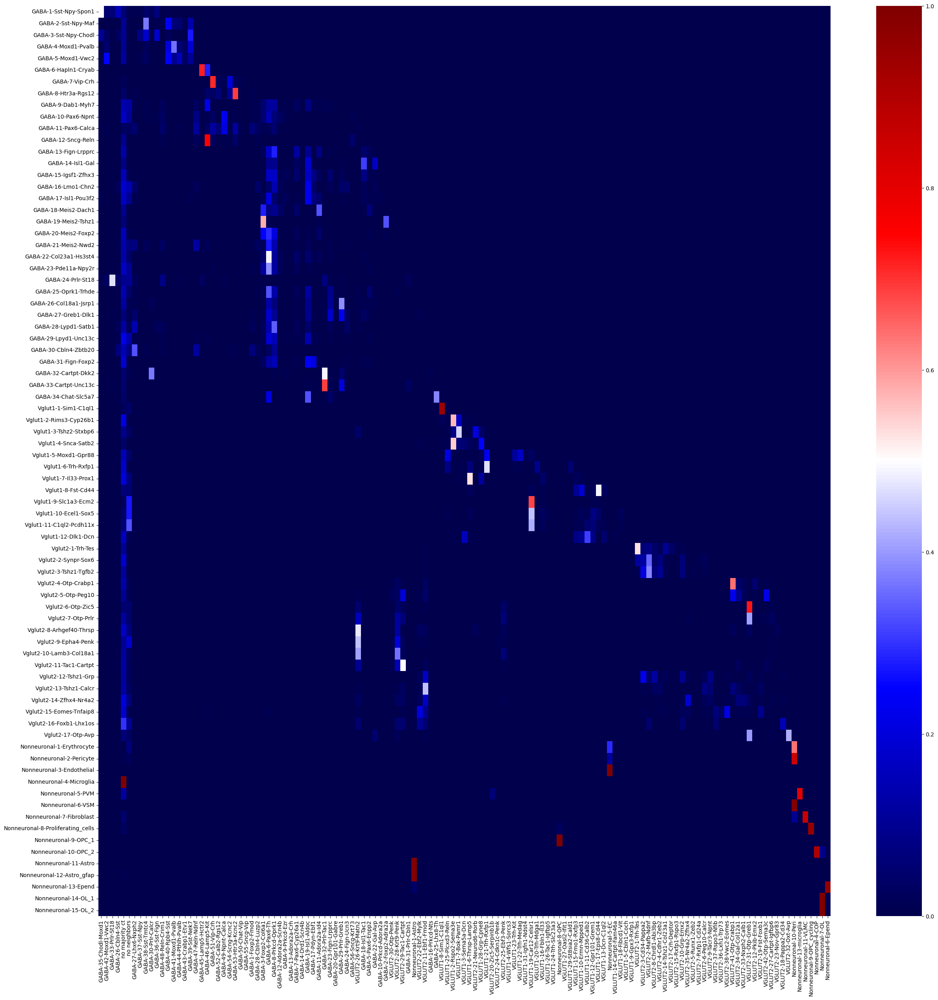

In [424]:
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_df_fn.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig(out_folder + 'frac_amy_cts_in_sd_cts_heatmap_full_names_union_r_'+ str(distance_threshold) + '.pdf')
plt.show()

In [333]:
frac_df_fn

,GABA-33-Prlr-St18,GABA-35-Chodl-Moxd1,no neighbors,GABA-42-Moxd1-Vwc2,no majority ct,GABA-38-Sst-Tmtc4,GABA-34-Prlr-Satb1,GABA-36-Sst-Fign,GABA-26-Cbln4-Sst,GABA-37-Sst-Npy,...,VGLUT2-23-Nov_Gpr83,VGLUT2-27-Cartpt_Igfbp6,VGLUT2-29-Tac1_Cartpt,VGLUT2-33-Nxph2_Calb1,VGLUT2-38-Vwc2_Eomes,VGLUT2-35-Nr4a2_Zfhx4,VGLUT2-39-Tcf7l2_Skor1,VGLUT2-18-Papp2_Cdh23,VGLUT2-36-Lxh1_Trp73,VGLUT2-32-Oxt_Avp
GABA-1-Sst-Npy-Spon1,0.22,0.71,0.01,0.0,0.03,0.01,0.01,0.01,0.01,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-2-Sst-Npy-Maf,0.0,0.02,0.03,0.03,0.05,0.63,0.0,0.16,0.0,0.03,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-3-Sst-Npy-Chodl,0.0,0.17,0.0,0.0,0.03,0.03,0.0,0.22,0.03,0.52,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-4-Moxd1-Pvalb,0.0,0.0,0.0,0.04,0.06,0.02,0.0,0.0,0.0,0.01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-5-Moxd1-Vwc2,0.0,0.01,0.01,0.87,0.03,0.03,0.0,0.0,0.0,0.01,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vglut2-13-Tshz1-Calcr,0.0,0.0,0.09,0.0,0.05,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.12,0.0,0.0,0.0,0.01,0.0,0.0
Vglut2-14-Zfhx4-Nr4a2,0.0,0.0,0.01,0.0,0.04,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.38,0.0,0.31,0.0,0.0,0.0,0.0
Vglut2-15-Eomes-Tnfaip8,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.35,0.01,0.0,0.0,0.08,0.0
Vglut2-16-Foxb1-Lhx1os,0.0,0.0,0.0,0.0,0.05,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.35,0.0,0.0


In [425]:
heatmap2 = frac_df_fn.hvplot.heatmap(title='Fraction of Amy cell types per SD Cell Types Post Cluster Label Transfer',  
                                                                                                cmap='seismic', width=1500, height=1000, colorbar=True)
heatmap2.opts(xrotation = 45, xlabel='Amy Cell Types',ylabel='SD Cell Types')
hvplot.show(heatmap2)
    
# Ensure output is displayed inline
hv.output(heatmap2, backend='bokeh')
hv.save(heatmap2, '/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/frac_amy_cts_in_sd_cts_heatmap_interactive_union.html', fmt='html')

Launching server at http://localhost:40191


:HeatMap   [columns,index]   (value)

array(['GABA-1-Foxp2-Fmod', 'GABA-2-Foxp2-Adra2a', 'GABA-3-Foxp2-Col6a1',
       'GABA-4-Foxp2-Htr1f', 'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th',
       'GABA-7-Pax6-Cyp26a1', 'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr',
       'GABA-10-Prkcd-Adora2a', 'GABA-11-Adora2a-Id4',
       'GABA-12-Adora2a-Scn4b', 'GABA-13-Adora2a-Crh',
       'GABA-14-Drd1-Scn4b', 'GABA-15-Drd1-Ebf1', 'GABA-16-Prkcd-Nts',
       'GABA-17-Pdyn-Ebf1', 'GABA-18-Isl1-Tac1', 'GABA-19-Isl1-Aldoc',
       'GABA-20-Gpr101-Gabre', 'GABA-21-Vdr-Nts', 'GABA-22-Gal-Avp',
       'GABA-23-Fign-Lrpprc', 'GABA-24-Fign-Ucn3', 'GABA-25-Lhx8-Th',
       'GABA-26-Cbln4-Sst', 'GABA-27-Lhx6-Nxph2', 'GABA-28-Cbln4-Luzp2',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-33-Prlr-St18', 'GABA-34-Prlr-Satb1',
       'GABA-35-Chodl-Moxd1', 'GABA-36-Sst-Fign', 'GABA-37-Sst-Npy',
       'GABA-38-Sst-Tmtc4', 'GABA-39-Sst-Nek7', 'GABA-40-Rpb4-Sst',
       'GABA-41-Moxd1-Pvalb', 'GABA-42-Mo

In [618]:
Counter(sd_metadata_df_subset_w_amc_hex.loc['amy_full_name'])

Counter({'no majority ct': 2463,
         'VGLUT1-19-Car12-Celsr1': 2173,
         'VGLUT2-26-Krt9-Matn2': 1444,
         'no neighbors': 1060,
         'VGLUT1-21-Trh-Rxfp1': 849,
         'GABA-6-Pax6-Th': 781,
         'VGLUT2-28-Krt9-Penk': 779,
         'GABA-8-Prkcd-Oprk1': 737,
         'VGLUT1-8-Sim1-C1ql1': 707,
         'Nonneuronal-10-Peri': 632,
         'GABA-3-Foxp2-Col6a1': 594,
         'VGLUT1-22-Trh-Medag': 551,
         'VGLUT2-31-Otp-Greb1': 514,
         'VGLUT1-6-Thrsp-Lamp5': 507,
         'GABA-29-Prlr-Greb1': 461,
         'VGLUT2-29-Tac1-Cartpt': 450,
         'Nonneuronal-5-EC': 449,
         'Nonneuronal-7-OL': 434,
         'Nonneuronal-1-Astro': 423,
         'GABA-32-Prlr-Tac1': 418,
         'VGLUT1-12-Gpr101-Grem1': 392,
         'GABA-19-Isl1-Aldoc': 374,
         'VGLUT1-17-Eps8-Cd44': 356,
         'VGLUT1-23-Trh-Kit': 346,
         'GABA-27-Lhx6-Nxph2': 316,
         'VGLUT2-2-Mafb-Ndnf': 315,
         'VGLUT1-7-Bok-Pamr1': 311,
         'GABA-46-La

In [619]:
amy_fn = amy_fn_dd_order
#add case for no neighbors
amy_fn = np.append(amy_fn,'no neighbors')
#amy_fn

### full name version, dd ordered
frac_df_fn_dd_order = pd.DataFrame(index=sd_fn, columns=amy_fn)

for i,sd_m in enumerate(sd_fn):
    for j,amy_m in enumerate(amy_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_metadata_df_subset_w_amc_hex.loc[:,sd_metadata_df_subset_w_amc_hex.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_df_fn_dd_order.loc[sd_m,amy_m] = frac

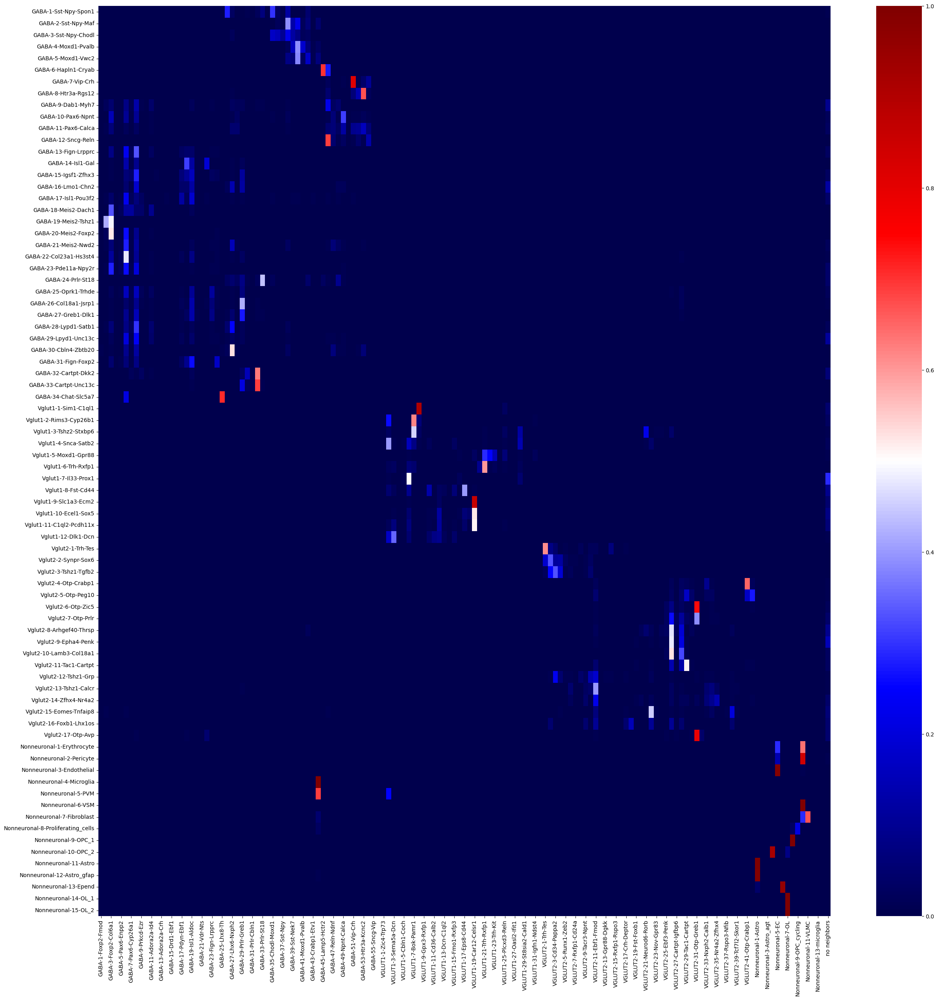

In [620]:
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_df_fn_dd_order.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
plt.savefig(out_folder + 'frac_amy_cts_in_sd_cts_heatmap_full_names_dd_order_union_sampleid.pdf')
plt.show()

In [621]:
heatmap2 = frac_df_fn_dd_order.hvplot.heatmap(title='Fraction of Amy cell types per SD Cell Types Post Cluster Label Transfer',  
                                                                                                cmap='seismic', width=1200, height=1000, colorbar=True)
heatmap2.opts(xrotation = 45, xlabel='Amy Cell Types',ylabel='SD Cell Types')
hvplot.show(heatmap2)
    
# Ensure output is displayed inline
hv.output(heatmap2, backend='bokeh')
hv.save(heatmap2, out_folder + 'frac_amy_cts_in_sd_cts_heatmap_interactive_full_names_dd_order_union_sampleid.html', fmt='html')

Launching server at http://localhost:38309


:HeatMap   [columns,index]   (value)

In [ ]:
#sort amy columns 

In [33]:
frac_df_fn

,GABA-35-Chodl-Moxd1,GABA-45-Lamp5-Hctr2,GABA-33-Prlr-St18,GABA-42-Moxd1-Vwc2,GABA-26-Cbln4-Sst,no majority ct,GABA-36-Sst-Fign,GABA-24-Fign-Ucn3,GABA-32-Prlr-Tac1,GABA-29-Prlr-Greb1,...,VGLUT2-24-Cdkn1c-Penk,VGLUT2-37-Rspo3-Nfib,Nonneuronal-10-Peri,Nonneuronal-5-EC,Nonneuronal-11-VLMC,Nonneuronal-9-OPC_cycling,Nonneuronal-4-COP,Nonneuronal-7-OL,Nonneuronal-1-Astro,Nonneuronal-3-Astro_agt
GABA-1-Sst-Npy-Spon1,0.34,0.01,0.25,0.02,0.19,0.11,0.04,0.01,0.01,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-2-Sst-Npy-Maf,0.01,0.01,0.0,0.06,0.0,0.09,0.09,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-3-Sst-Npy-Chodl,0.17,0.02,0.0,0.02,0.03,0.05,0.2,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-4-Moxd1-Pvalb,0.0,0.01,0.0,0.05,0.0,0.08,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GABA-5-Moxd1-Vwc2,0.0,0.02,0.0,0.28,0.0,0.06,0.02,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Nonneuronal-11-Astro,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.99,0.0
Nonneuronal-12-Astro_gfap,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.98,0.0
Nonneuronal-13-Epend,0.0,0.0,0.0,0.0,0.0,0.96,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.04,0.0
Nonneuronal-14-OL_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.99,0.0,0.0


# PCA based approach

In [ ]:
out_folder = '/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/'
#meta_data_df_pca = pd.read_json(out_folder + 'meta_data_df_pca.json')
#arr_pca = np.load(out_folder + 'arr_pca.npy')
#use harmonized PCA arr
#arr_pca_hm = np.load('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/amy_sd_hm_arr.npy')
#use metadata/harmonized arr w/ union and sampleid
meta_data_df_pca = pd.read_json(out_folder + 'meta_data_df_pca_union_sampleid.json')
arr_pca_hm = np.load('/bigdata/isaac/sd_amy_tsne_harmony_comp/pca/amy_sd_hm_arr_union_sampleid.npy')

In [623]:
meta_data_df_pca

,cell_class,markers,full_name,SampleID,dataset
TGGGAAGGTCGAGTGA-1_08-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X08_1,amy
AAAGTCCAGTACCATC-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
ATATCCTCAAAGGATT-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
CGAGTTACATCCTTCG-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
GGACGTCCACCCATAA-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
...,...,...,...,...,...
GAGAGGTCACATCATG-1_10X37_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X37_2,sd
ATCAGGTTCCACTAGA-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X35_2,sd
TCCACGTAGAGCATCG-1_10X37_1,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X37_1,sd
CTGCGAGCACTACGGC-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X35_2,sd


In [432]:
meta_data_df_pca.loc[meta_data_df_pca.loc[:,'dataset'] == 'amy',:].shape[0]

34961

In [433]:
meta_data_df_pca.loc[meta_data_df_pca.loc[:,'dataset'] == 'sd',:].shape[0]

26661

In [434]:
arr_pca

array([[ -2.54686507,  -1.04583227,   0.52259667, ...,  -3.27978997,
          0.92194246,  -0.30447123],
       [ -2.84567175,  -1.87517537,   0.55093051, ...,  -1.09343655,
          0.3888996 ,  -0.8354073 ],
       [ -2.90083009,  -2.19759689,   0.1187863 , ...,  -2.66734921,
         -0.21987517,  -0.07221028],
       ...,
       [  5.36950301,  26.09869806, -25.22416069, ...,   2.43708327,
         -2.41470865,  -1.3623531 ],
       [  5.88293547,  28.93230431, -27.54187003, ...,   1.98069459,
         -1.55174405,   0.47545773],
       [  6.0365225 ,  28.01823401, -23.58671846, ...,   3.04486788,
         -2.8967293 ,  -1.26799191]])

In [279]:
arr_pca_hm.shape

(61622, 19)

In [7]:
arr_pca.shape

(61622, 19)

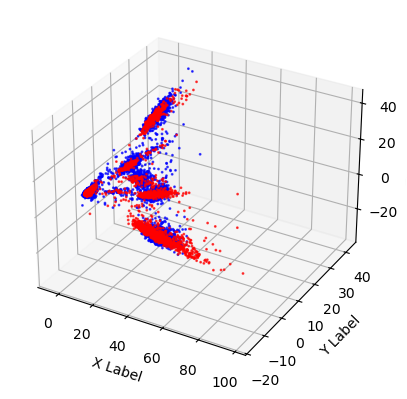

In [624]:
#%matplotlib widget #interactive
%matplotlib inline
# Extract the first three columns
x_amy = arr_pca_hm[:34961, 0]
y_amy = arr_pca_hm[:34961, 1]
z_amy = arr_pca_hm[:34961, 2]

x_sd = arr_pca_hm[34961:, 0]
y_sd = arr_pca_hm[34961:, 1]
z_sd = arr_pca_hm[34961:, 2]


# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(x_amy, y_amy, z_amy, s = 1, c='b', marker='o', alpha=0.7)
ax.scatter(x_sd, y_sd, z_sd, s = 1, c='r', marker='o', alpha=0.7)


# Set labels
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

Setup relevant datasets and labels. Split reference into 80% traning and 20% validation.

In [625]:
reference_data = arr_pca_hm[:meta_data_df_pca.loc[meta_data_df_pca.loc[:,'dataset'] == 'amy',:].shape[0],:]
reference_data.shape

(34961, 24)

In [626]:
test_data = arr_pca_hm[meta_data_df_pca.loc[meta_data_df_pca.loc[:,'dataset'] == 'amy',:].shape[0]:,:]
test_data.shape

(26661, 24)

In [627]:
meta_data_df_pca

,cell_class,markers,full_name,SampleID,dataset
TGGGAAGGTCGAGTGA-1_08-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X08_1,amy
AAAGTCCAGTACCATC-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
ATATCCTCAAAGGATT-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
CGAGTTACATCCTTCG-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
GGACGTCCACCCATAA-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,10X10_1,amy
...,...,...,...,...,...
GAGAGGTCACATCATG-1_10X37_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X37_2,sd
ATCAGGTTCCACTAGA-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X35_2,sd
TCCACGTAGAGCATCG-1_10X37_1,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X37_1,sd
CTGCGAGCACTACGGC-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,10X35_2,sd


In [628]:
reference_labels = np.array(meta_data_df_pca.iloc[:meta_data_df_pca.loc[meta_data_df_pca.loc[:,'dataset'] == 'amy',:].shape[0],2])
reference_labels.shape

(34961,)

In [629]:
# Step 1: Split reference dataset into training and validation sets
train_data, val_data, train_labels, val_labels = train_test_split(
    reference_data, reference_labels, test_size=0.2, random_state=42
)

In [630]:
train_data.shape

(27968, 24)

In [631]:
val_data.shape

(6993, 24)

In [632]:
train_labels.shape

(27968,)

In [633]:
#define alg/metric pairing to use for models
alg = 'brute'
metric = 'correlation'

In [634]:
# Step 2: Build NearestNeighbors model on training set
nbrs_train = NearestNeighbors(algorithm=alg, metric=metric).fit(train_data)

In [181]:
sorted(VALID_METRICS['brute'])

['braycurtis',
 'canberra',
 'chebyshev',
 'cityblock',
 'correlation',
 'cosine',
 'dice',
 'euclidean',
 'hamming',
 'haversine',
 'jaccard',
 'l1',
 'l2',
 'mahalanobis',
 'manhattan',
 'minkowski',
 'nan_euclidean',
 'precomputed',
 'rogerstanimoto',
 'russellrao',
 'seuclidean',
 'sokalmichener',
 'sokalsneath',
 'sqeuclidean',
 'yule']

In [635]:
# Step 3: Determine candidate radii
candidate_ks = [5, 10, 20, 50, 100, 500]  # Adjust based on your data
#candidate_ks = [50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150]
candidate_radii = []
for i,k in enumerate(candidate_ks):
    distances, _ = nbrs_train.kneighbors(train_data, n_neighbors=k)
    candidate_radii.append(np.mean(distances[:, k-1]))  # Mean distance to k-th neighbor
    print (f'distances: {distances.shape[1]}, candidate_radius: {candidate_radii[i]}')

distances: 5, candidate_radius: 0.050895477901639674
distances: 10, candidate_radius: 0.058458596244210174
distances: 20, candidate_radius: 0.06669250317343126
distances: 50, candidate_radius: 0.08138958368485166
distances: 100, candidate_radius: 0.09611581801982805
distances: 500, candidate_radius: 0.15534831841688215


In [450]:
candidate_radii

[0.05204289660484857,
 0.059896136446880556,
 0.0685121525309332,
 0.08392223127177427,
 0.09883307426263654,
 0.1631638498167831]

In [636]:
# Step 4: Evaluate radii on validation set
wv = False
best_accuracy = 0
best_radius = None
for radius in candidate_radii:
    distances, indices = nbrs_train.radius_neighbors(val_data, radius=radius)
    predicted_labels = []
    for i in range(len(val_data)):
        #for each point, check if any neighbors are within the radius
        if len(indices[i]) > 0:
            # Majority vote among neighbors within radius
            neighbor_labels = train_labels[indices[i]]
            #print (type(neighbor_labels))
            #print (list(neighbor_labels))
            #print (neighbor_labels)
            #print (indices[i])
            #print (str(neighbor_labels).split(' '))
            #label, _ = mode(list(neighbor_labels))
            label = Counter(list(neighbor_labels)).most_common(1)[0][0]
            predicted_labels.append(label)
        else:
            # No neighbors: mark as 'no neighbors'
            predicted_labels.append('no neighbors')
            #dist, idx = nbrs_train.kneighbors([val_data[i]], n_neighbors=1)
            #predicted_labels.append(train_labels[idx[0][0]])
    accuracy = np.mean(np.array(predicted_labels) == val_labels)
    print (accuracy)
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_radius = radius

print(f"Best radius: {best_radius}, Validation accuracy: {best_accuracy}")

0.5478335478335479
0.585013585013585
0.6071786071786072
0.6353496353496354
0.6422136422136422
0.6108966108966108
Best radius: 0.09611581801982805, Validation accuracy: 0.6422136422136422


In [452]:
candidate_radii

[0.05204289660484857,
 0.059896136446880556,
 0.0685121525309332,
 0.08392223127177427,
 0.09883307426263654,
 0.1631638498167831]

In [652]:
## Try weighted voting
wv = True
# Step 4: Define the weighted voting function
def weighted_vote(neighbor_distances, neighbor_labels):
    if len(neighbor_labels) == 0:
        return None  # No neighbors, will use fallback
    weight_sums = {}
    epsilon = 1e-5  # Small constant to avoid division by zero
    for dist, label in zip(neighbor_distances, neighbor_labels):
        weight = 1 / (dist + epsilon)  # Inverse distance weighting
        weight_sums[label] = weight_sums.get(label, 0) + weight
    # Find the label with the maximum weight sum
    max_sum = max(weight_sums.values())
    candidates = [label for label, w_sum in weight_sums.items() if w_sum == max_sum]
    if len(candidates) == 1:
        return candidates[0]
    else:
        # Resolve ties by picking the label of the closest neighbor
        min_dist = float('inf')
        best_label = None
        for dist, label in zip(neighbor_distances, neighbor_labels):
            if label in candidates and dist < min_dist:
                min_dist = dist
                best_label = label
        return best_label

# Step 5: Evaluate radii on validation set using weighted voting
best_accuracy = 0
best_radius = None
for radius in candidate_radii:
    distances, indices = nbrs_train.radius_neighbors(val_data, radius=radius)
    predicted_labels = []
    for i in range(len(val_data)):
        if len(indices[i]) > 0:
            neighbor_labels = train_labels[indices[i]]
            neighbor_distances = distances[i]
            predicted_label = weighted_vote(neighbor_distances, neighbor_labels)
            predicted_labels.append(predicted_label)
        else:
            # Fallback to nearest neighbor
            #dist, idx = nbrs_train.kneighbors([val_data[i]], n_neighbors=1)
            #predicted_label = train_labels[idx[0][0]]
            predicted_labels.append('no_neighbors')
    accuracy = np.mean(np.array(predicted_labels) == val_labels)
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_radius = radius

print(f"Best radius: {best_radius}, Validation accuracy: {best_accuracy}")

Best radius: 0.09611581801982805, Validation accuracy: 0.657943657943658


In [653]:
# Step 5: Transfer labels to test dataset using full reference set
nbrs_full = NearestNeighbors(algorithm=alg,metric=metric).fit(reference_data)
distances, indices = nbrs_full.radius_neighbors(test_data, radius=best_radius)

test_predicted_labels = []
for i in range(len(test_data)):
    if len(indices[i]) > 0:
        neighbor_labels = reference_labels[indices[i]]
        #label, _ = mode(neighbor_labels)
        label = Counter(list(neighbor_labels)).most_common(1)[0][0]
        test_predicted_labels.append(label)
    else:
        #dist, idx = nbrs_full.kneighbors([test_data[i]], n_neighbors=1)
        #test_predicted_labels.append(reference_labels[idx[0][0]])
        test_predicted_labels.append('no_neighbors')

In [453]:
np.shape(test_predicted_labels)

(26661,)

In [454]:
np.shape(reference_labels)

(34961,)

In [455]:
meta_data_df_pca

,cell_class,markers,full_name,dataset
TGGGAAGGTCGAGTGA-1_08-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,amy
AAAGTCCAGTACCATC-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,amy
ATATCCTCAAAGGATT-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,amy
CGAGTTACATCCTTCG-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,amy
GGACGTCCACCCATAA-1_10-1,GABA,Foxp2-Fmod,GABA-1-Foxp2-Fmod,amy
...,...,...,...,...
GAGAGGTCACATCATG-1_10X37_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,sd
ATCAGGTTCCACTAGA-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,sd
TCCACGTAGAGCATCG-1_10X37_1,Nonneuronal,OL_2,Nonneuronal-15-OL_2,sd
CTGCGAGCACTACGGC-1_10X35_2,Nonneuronal,OL_2,Nonneuronal-15-OL_2,sd


In [638]:
Counter(test_predicted_labels)

Counter({'VGLUT1-19-Car12-Celsr1': 3060,
         'VGLUT2-28-Krt9-Penk': 1938,
         'GABA-8-Prkcd-Oprk1': 1372,
         'GABA-3-Foxp2-Col6a1': 1099,
         'VGLUT2-26-Krt9-Matn2': 1070,
         'VGLUT1-22-Trh-Medag': 1049,
         'VGLUT1-23-Trh-Kit': 912,
         'GABA-41-Moxd1-Pvalb': 783,
         'VGLUT1-8-Sim1-C1ql1': 759,
         'VGLUT2-2-Mafb-Ndnf': 730,
         'GABA-32-Prlr-Tac1': 722,
         'Nonneuronal-10-Peri': 631,
         'VGLUT1-6-Thrsp-Lamp5': 620,
         'GABA-19-Isl1-Aldoc': 552,
         'VGLUT2-31-Otp-Greb1': 493,
         'Nonneuronal-5-EC': 463,
         'VGLUT2-42-Otp-Sema3c': 461,
         'Nonneuronal-7-OL': 438,
         'Nonneuronal-1-Astro': 424,
         'GABA-6-Pax6-Th': 409,
         'GABA-27-Lhx6-Nxph2': 395,
         'GABA-46-Lamp5-Kit': 377,
         'GABA-51-Vip-Crh': 371,
         'VGLUT2-29-Tac1-Cartpt': 363,
         'VGLUT1-28-Grp-Cpne8': 363,
         'VGLUT1-2-Rspo2-Sema3e': 346,
         'GABA-29-Prlr-Greb1': 344,
         'V

In [459]:
test_predicted_labels

['GABA-38-Sst-Tmtc4',
 'GABA-44-Pthlh-Pvalb',
 'GABA-33-Prlr-St18',
 'GABA-33-Prlr-St18',
 'GABA-35-Chodl-Moxd1',
 'GABA-35-Chodl-Moxd1',
 'GABA-26-Cbln4-Sst',
 'GABA-42-Moxd1-Vwc2',
 'GABA-33-Prlr-St18',
 'GABA-36-Sst-Fign',
 'GABA-36-Sst-Fign',
 'GABA-26-Cbln4-Sst',
 'GABA-37-Sst-Npy',
 'GABA-33-Prlr-St18',
 'GABA-36-Sst-Fign',
 'GABA-38-Sst-Tmtc4',
 'GABA-26-Cbln4-Sst',
 'GABA-27-Lhx6-Nxph2',
 'GABA-38-Sst-Tmtc4',
 'GABA-33-Prlr-St18',
 'GABA-36-Sst-Fign',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-38-Sst-Tmtc4',
 'GABA-38-Sst-Tmtc4',
 'GABA-38-Sst-Tmtc4',
 'GABA-38-Sst-Tmtc4',
 'GABA-35-Chodl-Moxd1',
 'GABA-38-Sst-Tmtc4',
 'GABA-38-Sst-Tmtc4',
 'GABA-36-Sst-Fign',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-35-Chodl-Moxd1',
 'GABA-36-Sst-Fign',
 'GABA-36-Sst-Fign',
 'GABA-26-Cbln4-Sst',
 'GABA-35-Chodl-Moxd1',
 'GABA-27-Lhx6-Nxph2',
 'GABA-35-Chodl-Moxd1',
 'GABA-33-Prlr-St18',
 'GABA-36-Sst-Fign',
 'GABA-35-Chodl-Moxd1',
 'GABA-26-Cbln4-Sst',
 'GABA-36-Sst-Fign',


In [191]:
sd_actual_labels = list(meta_data_df_pca.loc[meta_data_df_pca.loc[:,'dataset']=='sd','full_name'])
sd_actual_labels

['GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',
 'GABA-1-Sst-Npy-Spon1',


In [639]:
sd_fn = pd.unique(meta_data_df_pca.loc[meta_data_df_pca.loc[:,'dataset'] == 'sd','full_name'])
#amy_fn = pd.unique(meta_data_df_pca.loc[meta_data_df_pca.loc[:,'dataset'] == 'amy','full_name'])
amy_fn = amy_fn_dd_order

In [640]:
# use amy dd order
amy_fn_dd_order

array(['GABA-1-Foxp2-Fmod', 'GABA-2-Foxp2-Adra2a', 'GABA-3-Foxp2-Col6a1',
       'GABA-4-Foxp2-Htr1f', 'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th',
       'GABA-7-Pax6-Cyp26a1', 'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr',
       'GABA-10-Prkcd-Adora2a', 'GABA-11-Adora2a-Id4',
       'GABA-12-Adora2a-Scn4b', 'GABA-13-Adora2a-Crh',
       'GABA-14-Drd1-Scn4b', 'GABA-15-Drd1-Ebf1', 'GABA-16-Prkcd-Nts',
       'GABA-17-Pdyn-Ebf1', 'GABA-18-Isl1-Tac1', 'GABA-19-Isl1-Aldoc',
       'GABA-20-Gpr101-Gabre', 'GABA-21-Vdr-Nts', 'GABA-22-Gal-Avp',
       'GABA-23-Fign-Lrpprc', 'GABA-24-Fign-Ucn3', 'GABA-25-Lhx8-Th',
       'GABA-26-Cbln4-Sst', 'GABA-27-Lhx6-Nxph2', 'GABA-28-Cbln4-Luzp2',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-33-Prlr-St18', 'GABA-34-Prlr-Satb1',
       'GABA-35-Chodl-Moxd1', 'GABA-36-Sst-Fign', 'GABA-37-Sst-Npy',
       'GABA-38-Sst-Tmtc4', 'GABA-39-Sst-Nek7', 'GABA-40-Rpb4-Sst',
       'GABA-41-Moxd1-Pvalb', 'GABA-42-Mo

In [641]:
#add case for no neighbors
amy_fn = np.append(amy_fn,'no_neighbors')

In [642]:
amy_fn

array(['GABA-1-Foxp2-Fmod', 'GABA-2-Foxp2-Adra2a', 'GABA-3-Foxp2-Col6a1',
       'GABA-4-Foxp2-Htr1f', 'GABA-5-Pax6-Enpp2', 'GABA-6-Pax6-Th',
       'GABA-7-Pax6-Cyp26a1', 'GABA-8-Prkcd-Oprk1', 'GABA-9-Prkcd-Ezr',
       'GABA-10-Prkcd-Adora2a', 'GABA-11-Adora2a-Id4',
       'GABA-12-Adora2a-Scn4b', 'GABA-13-Adora2a-Crh',
       'GABA-14-Drd1-Scn4b', 'GABA-15-Drd1-Ebf1', 'GABA-16-Prkcd-Nts',
       'GABA-17-Pdyn-Ebf1', 'GABA-18-Isl1-Tac1', 'GABA-19-Isl1-Aldoc',
       'GABA-20-Gpr101-Gabre', 'GABA-21-Vdr-Nts', 'GABA-22-Gal-Avp',
       'GABA-23-Fign-Lrpprc', 'GABA-24-Fign-Ucn3', 'GABA-25-Lhx8-Th',
       'GABA-26-Cbln4-Sst', 'GABA-27-Lhx6-Nxph2', 'GABA-28-Cbln4-Luzp2',
       'GABA-29-Prlr-Greb1', 'GABA-30-Prlr-Calcr', 'GABA-31-Prlr-Cbln1',
       'GABA-32-Prlr-Tac1', 'GABA-33-Prlr-St18', 'GABA-34-Prlr-Satb1',
       'GABA-35-Chodl-Moxd1', 'GABA-36-Sst-Fign', 'GABA-37-Sst-Npy',
       'GABA-38-Sst-Tmtc4', 'GABA-39-Sst-Nek7', 'GABA-40-Rpb4-Sst',
       'GABA-41-Moxd1-Pvalb', 'GABA-42-Mo

In [654]:
sd_metadata_df_subset_pca = pd.DataFrame(index=['full_name','amy_full_name'], columns = meta_data_df_pca.loc[meta_data_df_pca.loc[:,'dataset'] == 'sd',:].index)

sd_metadata_df_subset_pca

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
full_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amy_full_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [655]:
sd_metadata_df_subset_pca.loc['full_name'] = sd_actual_labels
sd_metadata_df_subset_pca.loc['amy_full_name'] = test_predicted_labels

In [656]:
sd_metadata_df_subset_pca

,CTCGAGGCATCCGTTC-1_10X52_3,GTCCTCACACGACCTG-1_10X52_2,GGCTTGGGTCGGTACC-1_10X52_2,GGGAGTATCAGACCTA-1_10X52_3,CGTGCTTTCAAAGAAC-1_10X51_2,CGCAGGTTCGGTTAGT-1_10X52_1,CTACGGGCAGTCTCTC-1_10X51_2,AGGAGGTTCATTTGGG-1_10X35_1,ATCAGGTCACGAAGAC-1_10X36_2,CAAGGGAGTTCCACAA-1_10X38_2,...,GCACGTGGTTATTCCT-1_10X37_1,CAAGAGGGTCAATCTG-1_10X36_2,GGTGTCGAGAAGCTGC-1_10X36_2,AAGCCATGTGGATGAC-1_10X35_1,TTCTTCCCAAGACCTT-1_10X35_1,GAGAGGTCACATCATG-1_10X37_2,ATCAGGTTCCACTAGA-1_10X35_2,TCCACGTAGAGCATCG-1_10X37_1,CTGCGAGCACTACGGC-1_10X35_2,CTCTGGTTCGAAGCAG-1_10X37_1
full_name,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,GABA-1-Sst-Npy-Spon1,...,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2,Nonneuronal-15-OL_2
amy_full_name,GABA-36-Sst-Fign,GABA-41-Moxd1-Pvalb,GABA-33-Prlr-St18,GABA-33-Prlr-St18,GABA-33-Prlr-St18,GABA-33-Prlr-St18,GABA-36-Sst-Fign,GABA-38-Sst-Tmtc4,GABA-27-Lhx6-Nxph2,GABA-42-Moxd1-Vwc2,...,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL,Nonneuronal-7-OL


In [657]:
### full name version
frac_df_fn_pca = pd.DataFrame(index=sd_fn, columns=amy_fn)

for i,sd_m in enumerate(sd_fn):
    for j,amy_m in enumerate(amy_fn):
        #fraction of sd cell type in amy cell type
        sd_ct_df = sd_metadata_df_subset_pca.loc[:,sd_metadata_df_subset_pca.loc['full_name']==sd_m]
        n_sd = sd_ct_df.shape[1]
        #n_sd = len([i for i, x in enumerate(sd_actual_labels) if x == sd_m])
        amy_in_sd_ct_df = sd_ct_df.loc[:,sd_ct_df.loc['amy_full_name',:] == amy_m]
        n_amy_in_sd_ct = amy_in_sd_ct_df.shape[1]
        #n_pred = len([i for i, x in enumerate(test_predicted_labels) if x == amy_m])
        frac = round(n_amy_in_sd_ct/n_sd,2)
        frac_df_fn_pca.loc[sd_m,amy_m] = frac

In [647]:
frac_df_fn_pca.sum(axis=1)

GABA-1-Sst-Npy-Spon1          1.0
GABA-2-Sst-Npy-Maf           0.99
GABA-3-Sst-Npy-Chodl          1.0
GABA-4-Moxd1-Pvalb           0.99
GABA-5-Moxd1-Vwc2             1.0
                             ... 
Nonneuronal-11-Astro          1.0
Nonneuronal-12-Astro_gfap     1.0
Nonneuronal-13-Epend          1.0
Nonneuronal-14-OL_1           1.0
Nonneuronal-15-OL_2           1.0
Length: 78, dtype: object

In [648]:
str(round(best_radius,1))

'0.1'

In [518]:
wv

True

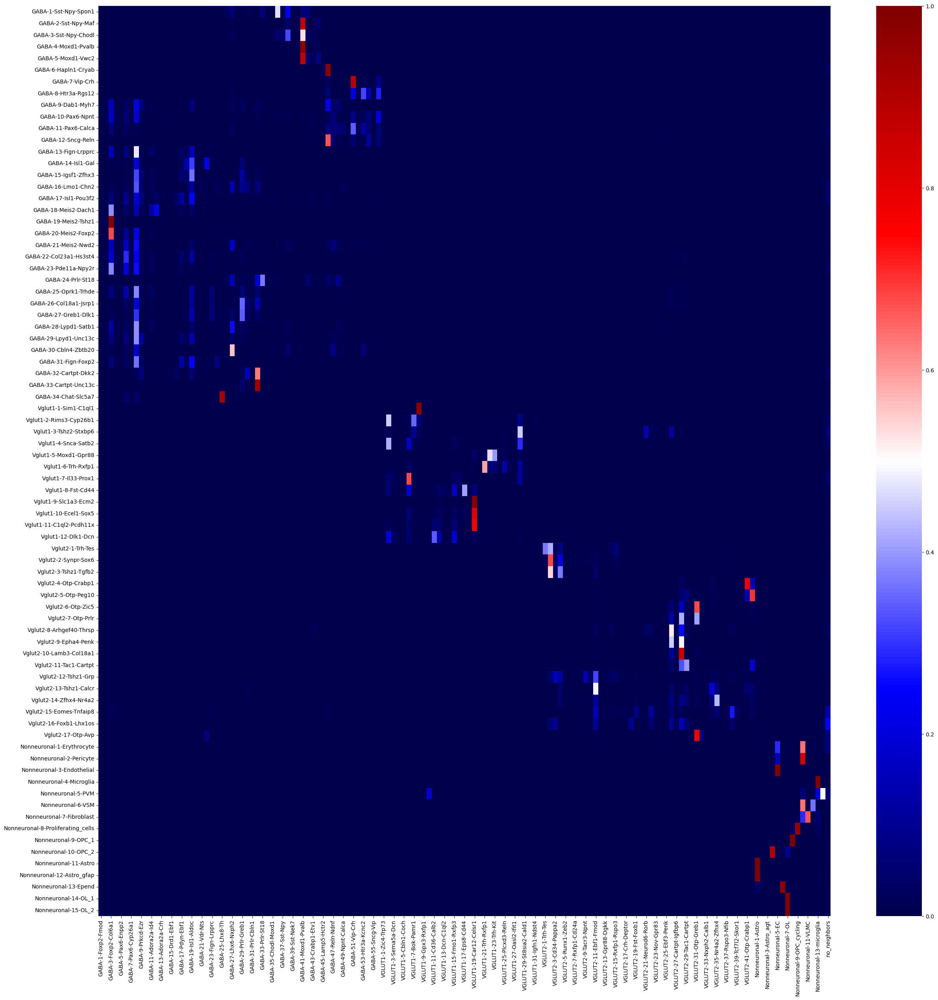

In [658]:
fig,ax = plt.subplots(figsize = (30,30))
sns.heatmap(frac_df_fn_pca.astype('float32'), annot=False,  cmap='seismic')
#ax.set_xticklabels(ax.get_xticks(), rotation = 20)
if wv == True:
    plt.savefig(out_folder + 'arr_pca_hm/' + 'frac_df_fn_pca_hm_union_sampleid_r_'+str(round(best_radius,1)) + '_wv_' + alg + '_' + metric + '.pdf')
else:
    plt.savefig(out_folder + 'arr_pca_hm/' + 'frac_df_fn_pca_hm_union_sampleid_r_'+str(round(best_radius,1)) + alg + '_' + metric + '.pdf')
plt.show()

In [659]:
heatmap2 = frac_df_fn_pca.hvplot.heatmap(title='Fraction of Amy cell types per SD Cell Types Post Cluster Label Transfer [PCA]',  
                                                                                                cmap='seismic', width=1500, height=1000, colorbar=True)
heatmap2.opts(xrotation = 45, show_grid = False, xlabel='Amy Cell Types',ylabel='SD Cell Types')
hvplot.show(heatmap2)
    
# Ensure output is displayed inline
hv.output(heatmap2, backend='bokeh')
if wv == True:
    hv.save(heatmap2, out_folder + 'arr_pca_hm/' + 'frac_amy_cts_in_sd_cts_heatmap_interactive_PCA_hm_r_union_sampleid' + str(round(best_radius,1)) + '_wv_' + alg + '_' + metric +  '.html', fmt='html')
else:
    hv.save(heatmap2, out_folder + 'arr_pca_hm/' + 'frac_amy_cts_in_sd_cts_heatmap_interactive_PCA_hm_r_union_sampleid' + str(round(best_radius,1)) + alg + '_' + metric +  '.html', fmt='html')

Launching server at http://localhost:45065


:HeatMap   [columns,index]   (value)